# <span style="color:#cccc00"><strong>Time Series Project

## <span style="color:#cccc00"><strong>Import libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.seasonal import STL
from matplotlib.dates import YearLocator
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm
from scipy.stats import boxcox
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import boxcox
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.arima.model import ARIMAResults
from scipy.special import inv_boxcox
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from sklearn.metrics import mean_squared_error as mse
from sklearn.model_selection import TimeSeriesSplit

## <span style="color:#cccc00"><strong>Import data

In [5]:
data= pd.read_csv("airline-passengers.csv")
data

,Month,Passengers
0,1949-01,112
1,1949-02,118
2,1949-03,132
3,1949-04,129
4,1949-05,121
...,...,...
139,1960-08,606
140,1960-09,508
141,1960-10,461
142,1960-11,390


In [6]:
# Convert "Month" column to date time
data["Month"]= pd.to_datetime(data["Month"], format="%Y-%m")
data

,Month,Passengers
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121
...,...,...
139,1960-08-01,606
140,1960-09-01,508
141,1960-10-01,461
142,1960-11-01,390


In [7]:
# Set the index of the dataframe as the date column
data= data.set_index("Month")
data

,Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121
...,...
1960-08-01,606
1960-09-01,508
1960-10-01,461


## <span style="color:#cccc00"><strong>Explore the data

### <span style="color:#cccc00">Plot the data

<AxesSubplot:xlabel='Month'>

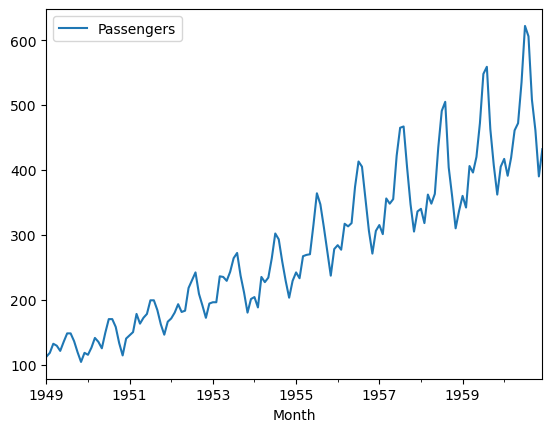

In [8]:
data.plot()

<span style= 'color: #ff5555; font-weight:bold'>We can see that our data has a linear increasing trend (visually)</span>

### <span style="color:#cccc00">Data Decomposition

* <span style= 'color: #ff5555; font-weight:bold'>We will explore seasonality, trend and residual components</span>

* <span style= 'color: #ff5555; font-weight:bold'>We specified <span style="color:#77aa77">"period"</span> parameter as <span style="color:#77aa77">12</span>, because our data is monthly data and it may have annual seasonal pattern</span>

* <span style= 'color: #ff5555; font-weight:bold'>We also specified <span style="color:#77aa77">"model"</span> parameter as <span style="color:#77aa77">"additive"</span>, because our data shows a pattern that dosen't increase or decrease with the time if we neglect the tren component</span>

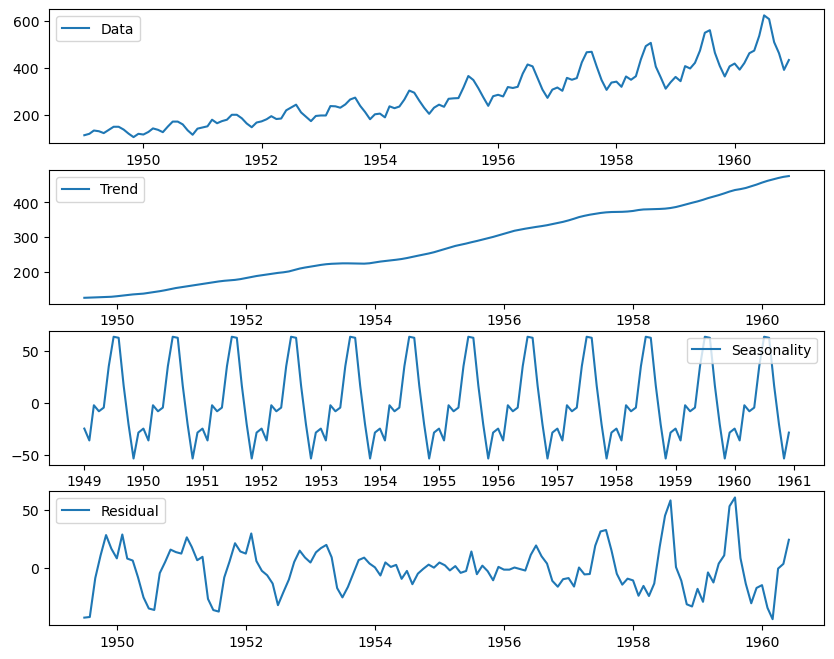

In [9]:
# Decompose the data using seasonal_decompose from sklearn.tsa (time series analysis)
decomposition = seasonal_decompose(data['Passengers'], model= 'additive', period=12)

# plot four plots (data, trend, seasonal component, residual)
fig, ax = plt.subplots(4,1, figsize=(10,8))
ax[0].plot(data['Passengers'], label='Data')
ax[0].legend()
ax[1].plot(decomposition.trend, label='Trend')
ax[1].legend()
ax[2].plot(decomposition.seasonal, label='Seasonality')
# Set the axis of the seasonal component plot to show all the years
ax[2].xaxis.set_major_locator(YearLocator())
ax[2].legend()
ax[3].plot(decomposition.resid, label='Residual')
ax[3].legend()
plt.show()

* <span style= 'color: #ff5555; font-weight:bold'>It's now obvious that our trend is <span style="color:#77aa77">increasing and almost linear</span></span>

* <span style= 'color: #ff5555; font-weight:bold'>there is a annual seasonal component in the data

## <span style="color:#cccc00"><strong>(1) Simple Moving average (MA)</strong><span>

### <span style="color:#cccc00">One point</span>

* <span style= 'color: #ff5555; font-weight:bold'>Here we'll define some window sizes and calculate the moving average over them and keep the one with the lowest <span style="color:#77aa77">RMSE</span></span>

In [10]:
# This function takes data and window size and the data and return the new data
def moving_average(data, window_size):
    ma_series = data['Passengers'].rolling(window_size).mean()
    return ma_series

In [11]:
# This function takes data and window size and return best_window_size, best_rmse, best_ma_series
def find_best_window_size(data, window_sizes):
    best_window_size = None
    best_rmse = np.inf
    best_ma_series = None
    
    for window_size in window_sizes:
        ma_series = moving_average(data, window_size)
        rmse = mean_squared_error(data['Passengers'][window_size-1:], ma_series[window_size-1:], squared= False)
        
        if rmse < best_rmse:
            best_window_size = window_size
            best_rmse = rmse
            best_ma_series = ma_series
    return best_window_size, best_rmse, best_ma_series

In [12]:
# Get the best moving average values and their corresponding window size and RMSE value
best_window_size, best_rmse, best_ma_series= find_best_window_size(data, range(3, len(data)//2))

In [13]:
#best window size
best_window_size

3

In [14]:
#best rmse
best_rmse

28.099142608564826

In [15]:
##best ma_series
best_ma_series

Month
1949-01-01           NaN
1949-02-01           NaN
1949-03-01    120.666667
1949-04-01    126.333333
1949-05-01    127.333333
                 ...    
1960-08-01    587.666667
1960-09-01    578.666667
1960-10-01    525.000000
1960-11-01    453.000000
1960-12-01    427.666667
Name: Passengers, Length: 144, dtype: float64

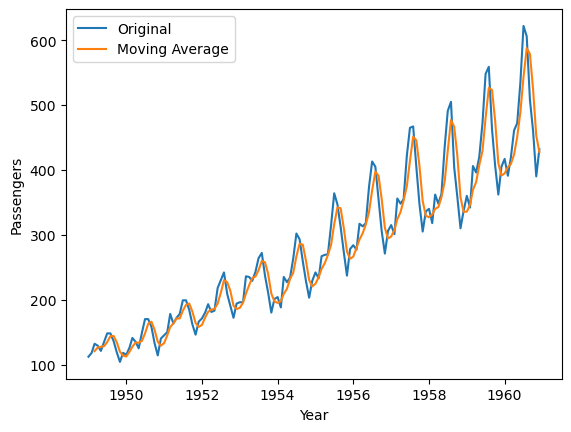

In [16]:
# plot original and moving average data
fig, ax = plt.subplots()
ax.plot(data['Passengers'], label='Original')
ax.plot(best_ma_series, label='Moving Average')
ax.set_xlabel('Year')
ax.set_ylabel('Passengers')
ax.legend()
plt.show()

<span style= 'color: #ff5555; font-weight:bold'>Predection using MA</span>

In [17]:
# Calculate the next predicted value
last_ma_values = best_ma_series[-best_window_size:]
next_predicted_value = np.mean(last_ma_values)

print("Next predicted value:", next_predicted_value)

Next predicted value: 468.5555555555556


In [18]:
best_ma_series = best_ma_series.tolist()

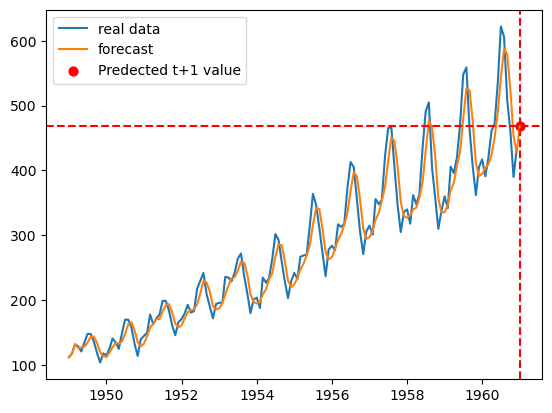

RMSE: 28.182451827627567
Predicted value for t+1: 468.5555555555556


In [19]:
best_ma_series.append(next_predicted_value)
for i in range(0, best_window_size):
    best_ma_series[i] = data["Passengers"].iloc[i]

ax= plt.subplot()
ax.plot(data.index, data["Passengers"],label = 'real data')
new_index = pd.date_range(start=data.index.min(), end=data.index.max()+pd.Timedelta(days=31), freq="MS")
ax.plot(new_index, best_ma_series, label = 'forecast')

ax.scatter(new_index[-1], best_ma_series[-1], color= 'red', s=[40], label= 'Predected t+1 value')
ax.axhline(y=best_ma_series[-1], color='r', linestyle='--')
ax.axvline(x=new_index[-1], color='r', linestyle='--')

ax.legend()

plt.show()

rmse = mean_squared_error(data["Passengers"].iloc[best_window_size:], best_ma_series[best_window_size:-1], squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", best_ma_series[-1])

### <span style="color:#cccc00">Simple train test split</span>

<span style= 'color: #ff5555; font-weight:bold'>Moving Average will be very bad in long term predictions as it will <span style="color:#77aa77">saturate after a period of time to a fixed value</span></span>

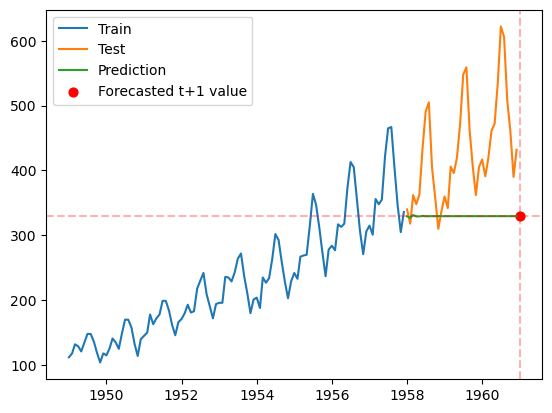

RMSE: 126.1111751652439
Predicted value for t+1: 329.55555555850214


In [20]:
# Split the data into train and test sets with a test set size of 25%
# We used shuffle= False because we are working with a time series and the order of the data is important
train, test = train_test_split(data, test_size=0.25, shuffle=False)

pred = []
# Add the three predictions that will be nan if we used the test set to the prediction list using the last n elements in the train set and first n-1 elements in the test set
for i in range(best_window_size):
        pred.append(np.mean(data["Passengers"].iloc[len(train)-best_window_size+i:len(train)+i]))

# Loop over the length of the test set
for i in range(len(test)-3):
        # Predict the next value and add it to the prediction list
        pred.append(np.mean(pred[i:i+best_window_size]))

# Plot the train data
plt.plot(train.index, train["Passengers"], label="Train")
# Plot the test data
plt.plot(test.index, test["Passengers"], label="Test")
# Plot the prediction
plt.plot(test.index, pred, label="Prediction")

forecast_t_plus_1 = np.mean(pred[-best_window_size:])

# Scatter the predicted value of t+1 and highlight its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color='red', s=[40], label='Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha=0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha=0.3)

plt.legend()
plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(test["Passengers"], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)


### <span style="color:#cccc00">Roll Forward</span>

<span style="color:#ff5555"><strong>MA is working with the concept of rolling, but here we will apply the MA taking our window size as increasing number that increase after predection of the next point starting with a window size 24</strong></span>

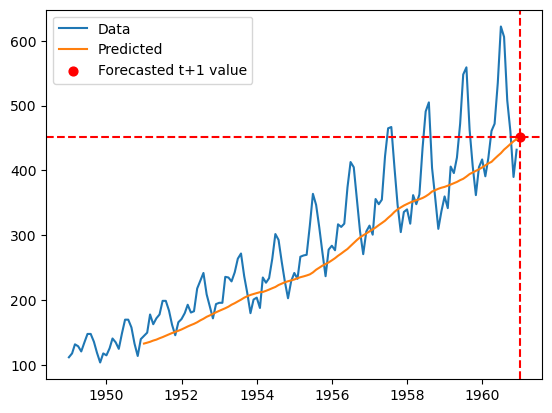

RMSE: 59.91664095096805
Predicted value for t+1: 452.25


In [21]:
pred = []
window_size = 24

for i in range(window_size, len(data)):
    train = data["Passengers"].iloc[i-window_size:i]
    pred.append(np.mean(train))

# Forecast the value at t+1
forecast_t_plus_1 = np.mean(data["Passengers"].iloc[-window_size:])

plt.plot(data.index, data["Passengers"], label="Data")
plt.plot(data[window_size:].index, pred, label="Predicted")

# Scatter the predicted value of t+1 and highlight its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()
plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(data["Passengers"].values[window_size:], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)


### <span style="color:#cccc00">Cross validation</span>

<span style= 'color: #ff5555; font-weight:bold'>Here we will face the same problem we faced in the fixed partitioning that is moving Average will be very bad in long term predictions as it will <span style="color:#77aa77">saturate after a period of time to a fixed value</span></span>

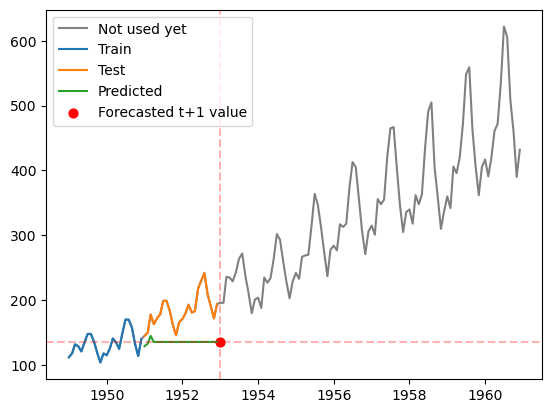

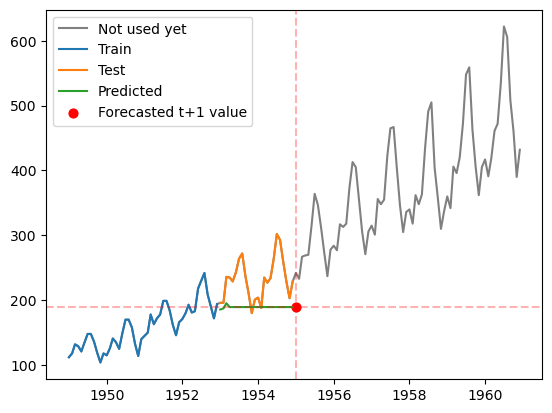

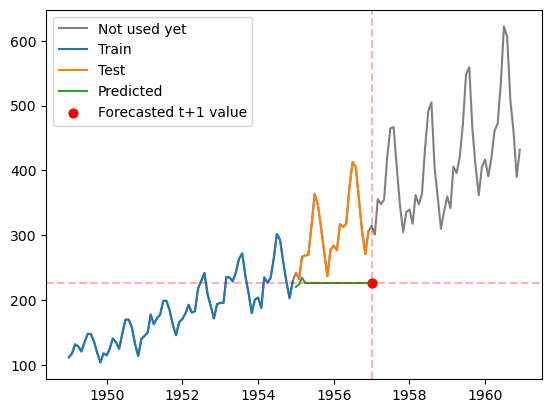

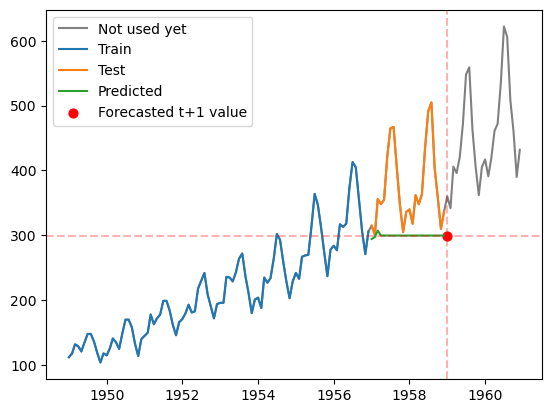

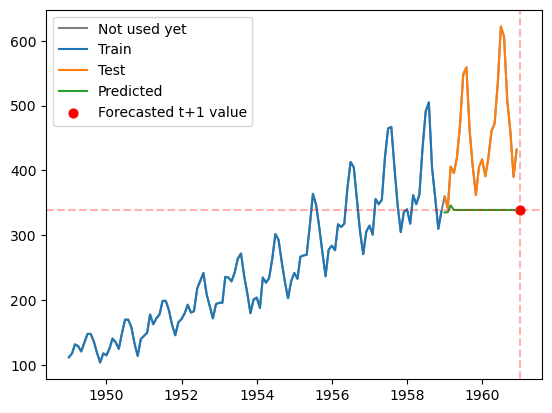

In [22]:
# Create a time-series cross-validator with 5 splits
time_series_splits = TimeSeriesSplit(n_splits=5)

# Initialize prediction list and RMSE list
y_pred_all = []
rmse_all= []

# This variable will hold the place of the first point that will be predicted in the first iteration
test_start = list(time_series_splits.split(data))[0][1][0]

# Loop through the splits
# Time_series_splits.split(data) have in each iteration two lists, one for the indices of all train points and the other is for the indices of all test points in this iteration
for train_index, test_index in time_series_splits.split(data):
    y_pred = []
    # Get the train data and test data for this split (iteration) from their indices
    train, test = data.iloc[train_index], data.iloc[test_index]
    
    # Add the three predictions that will be nan if we used the test set to the prediction list using the last n elements in the train set and first n-1 elements in the test set
    for i in range(best_window_size):
        y_pred.append(np.average(data["Passengers"].iloc[len(train)-best_window_size+i:len(train)+i]))

    # Predict the values during the test period one by one
    for i in range(best_window_size, len(test)):
        y_pred.append(np.average(y_pred))

    # Add the prediction of this iteration (split) to the overall prediction
    y_pred_all.append(y_pred)

    # Calculate the root mean squared error (RMSE) for this split
    rmse = mean_squared_error(test["Passengers"], y_pred, squared=False)

    # Add the current iteration RMSE to the RMSE list
    rmse_all.append(rmse)

    # Predict the value of the next point after the test portion (t+1)
    forecast_t_plus_1 = np.average(y_pred)

    # Visualize each iteration
    # Plot the original data with gray color and it will be overridden with train and test portions and the remaining part will be the part that we didn't use in this iteration
    plt.plot(data.index, data["Passengers"], color="gray", label="Not used yet")
    # Plot the train data
    plt.plot(data.index[train_index], train["Passengers"], label= "Train")
    # Plot the test data
    plt.plot(data.index[test_index], test["Passengers"], label= "Test")
    # Plot the predicted data
    plt.plot(data.index[test_index], y_pred, label= "Predicted")

    # Define new index to add the index of the next point to it to visualize it
    new_index = pd.date_range(start=train.index.min(), end=test.index.max()+pd.Timedelta(days=31), freq="MS")
    # Scatter the predicted value of t+1 and highlight its location by vertical and horizontal dashed lines
    plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
    plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
    plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

    plt.legend()
    plt.show()

### <span style="color:#cccc00">Cross validation for all data</span>

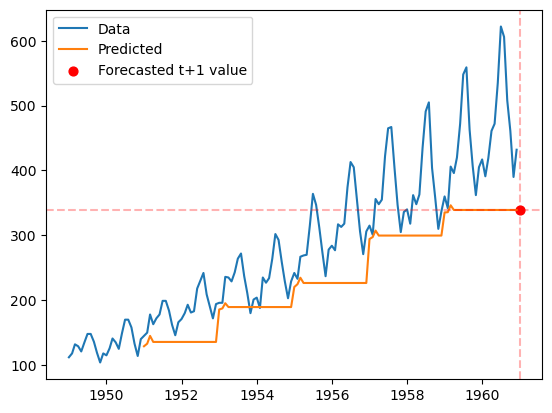

Average value for RMSE: 85.9929307459515
Predicted value for t+1: 339.1111111111111


In [23]:
# Concatenate the predicted values from all splits
y_pred_all = np.concatenate(y_pred_all)

# Plot the original
plt.plot(data.index, data["Passengers"], label="Data")
#Plot the predicted data starting from the first place was predicted in the first iteration
plt.plot(data.index[test_start:], y_pred_all, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

plt.legend()
plt.show()

# Calculate the average RMSE
avg_rmse= np.mean(rmse_all)

# Print the RMSE
print("Average value for RMSE:", avg_rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)


### <span style="color:#cccc00">Conclusion</span>

The simple moving average is a popular method for smoothing time series data and can be used for forecasting. It involves calculating the mean of a rolling window of the time series data, where the size of the window is a parameter that can be adjusted.

When using a simple moving average for forecasting, the results are produced by taking the mean of a rolling window of past observations and using that as the prediction for the next time period. The size of the rolling window can have a significant impact on the accuracy of the forecast, with larger windows resulting in smoother forecasts but potentially missing important trends or patterns in the data.

<span style= 'color: #ff5555; font-weight:bold;'>Pros:

The simple moving average is a straightforward and easy-to-understand method for smoothing time series data and forecasting.

It can be used to identify trends and patterns in the data and can serve as a baseline against which to compare more complex forecasting methods.

It is relatively fast and efficient, making it suitable for large datasets.

<span style= 'color: #ff5555; font-weight:bold;'>Cons:

The simple moving average assumes that the future values of the time series will be similar to the recent past values, which may not always be accurate.

It can perform poorly if the time series has sudden changes or outliers that are not captured by the rolling window.

The choice of window size can be subjective and may require some trial and error to find the optimal value for a given dataset.

<span style= 'color: #ff5555; font-weight:bold;'>Successes of simple moving average:

In this dataset exhibits a clear upward trend over time, which simple moving average can capture reasonably well. This suggests that simple moving average can be an effective forecasting tool for this dataset.

<span style= 'color: #ff5555; font-weight:bold;'>Failures of simple moving average:

In this dataset exhibits seasonality (i.e., recurring patterns at fixed intervals), which simple moving average may not be able to capture as effectively. Seasonality can affect the accuracy of forecasts, especially when there are interactions between seasonality and other factors.

<span style= 'color: #ff5555; font-weight:bold;'>Overall, the simple moving average is a useful tool for smoothing time series data and forecasting, but its accuracy depends heavily on the properties of the underlying data and the choice of window size. It can be a good starting point for forecasting, but more complex methods may be necessary for accurate predictions in certain cases.

## <span style="color:#cccc00"><strong>(2) Naïve Forecast</strong><span>

### <span style="color:#cccc00">One Point</span>

Next predicted value: 432


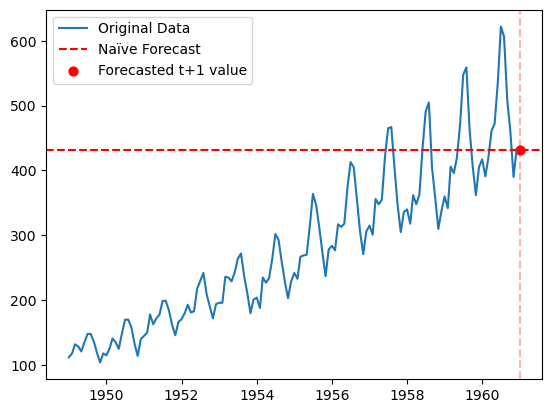

In [24]:
# Calculate the naïve forecast
naive_forecast = data['Passengers'].iloc[-1]

print("Next predicted value:", naive_forecast)

# Plot the original data and the naïve forecast
plt.plot(data.index, data['Passengers'], label='Original Data')
plt.axhline(y=naive_forecast, color='red', linestyle='--', label='Naïve Forecast')

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], naive_forecast, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=naive_forecast, color='r', linestyle='--', alpha= 0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

plt.legend()
plt.show()

### <span style="color:#cccc00">Simple train test split</span>

Next predicted value: 336
RMSE: 121.14


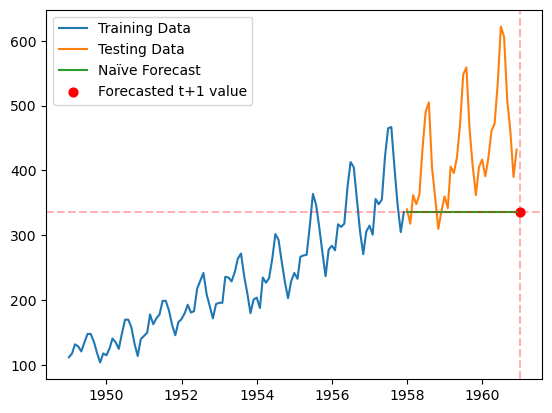

In [25]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
train_data, test_data = train_test_split(data, test_size=0.25, shuffle=False)

# Calculate the naïve forecast
naive_forecast = train_data['Passengers'].iloc[-1]

print("Next predicted value:", naive_forecast)

# Create an array of the same length as the test data, with all values set to the naïve forecast
naive_predictions = np.full(len(test_data), naive_forecast)

# Calculate the root mean squared error of the naïve forecast
rmse = mean_squared_error(test_data['Passengers'], naive_predictions, squared=False)

# Print the RMSE
print(f'RMSE: {rmse:.2f}')

# Plot the original data and the naïve forecast
plt.plot(train_data.index, train_data['Passengers'], label='Training Data')
plt.plot(test_data.index, test_data['Passengers'], label='Testing Data')
plt.plot(test_data.index, naive_predictions, label='Naïve Forecast')

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], naive_forecast, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=naive_forecast, color='r', linestyle='--', alpha= 0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

plt.legend()
plt.show()

<span style= 'color: #ff5555; font-weight:bold'>Pros: 

<span style= 'color: #55ff55'>Simple and easy to implement.

<span style= 'color: #55ff55'>Provides a quick estimate of model performance.

<span style= 'color: #ff5555; font-weight:bold'>Cons: 

<span style= 'color: #55ff55'>Can result in overfitting or underfitting if the chosen partition is not representative of the data.

<span style= 'color: #55ff55'>Naïve Forecast will be very bad because take the same last point 

### <span style="color:#cccc00">Roll Forward</span>

In [26]:
pred= []
window_train_size= 24

for i in range(window_train_size, len(data)):
    train= data["Passengers"].iloc[:i]

    pred.append(train.iloc[-1])

# Forecast the value at t+1
forecast_t_plus_1= train.iloc[-1]

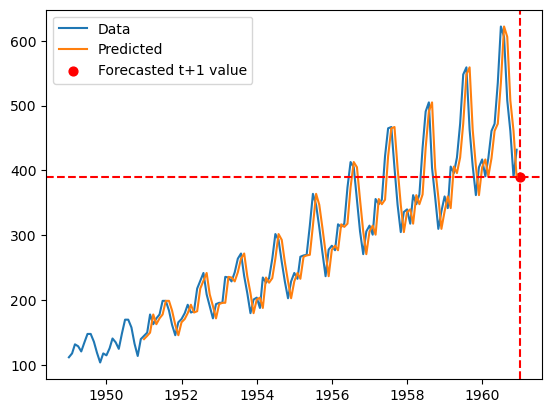

RMSE: 36.24752865138992
Predicted value for t+1: 390


In [27]:
plt.plot(data.index, data["Passengers"], label="Data")
plt.plot(data[24:].index, pred, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()
plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(data["Passengers"].values[24:], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)

<span style= 'color: #ff5555; font-weight:bold'>Pros: 

<span style= 'color: #55ff55'>Considers all the available data and provides a more realistic estimate of model performance.

<span style= 'color: #ff5555; font-weight:bold'>Cons: 

<span style= 'color: #55ff55'>Can be computationally expensive, especially for large datasets. The results may vary depending on the starting point.

### <span style="color:#cccc00">Cross validation</span>

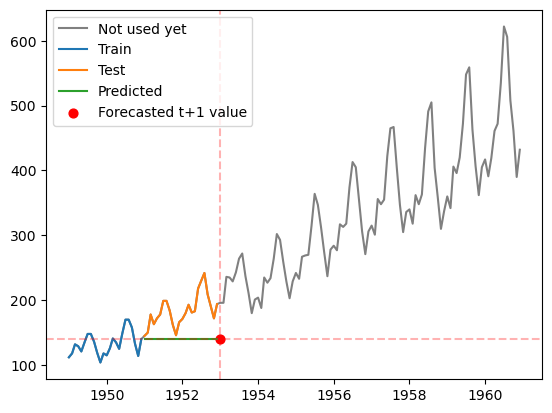

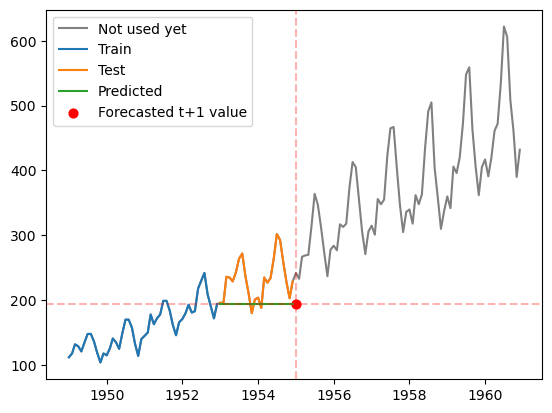

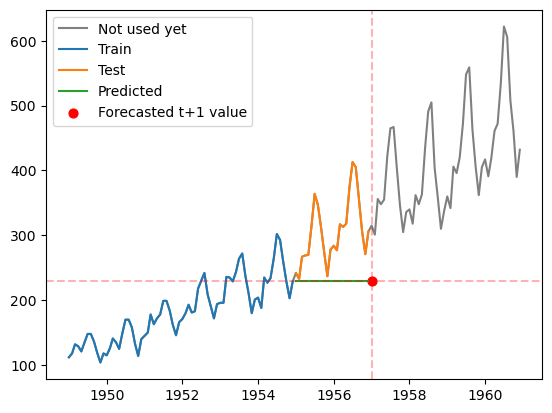

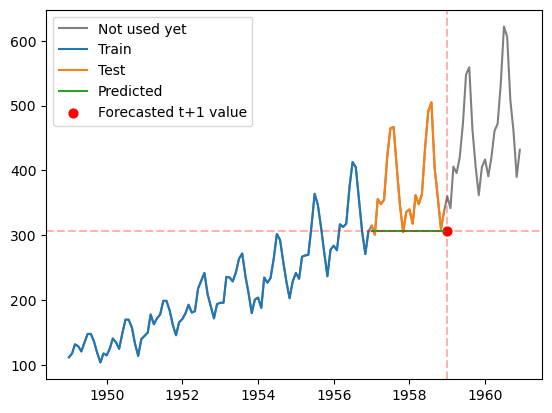

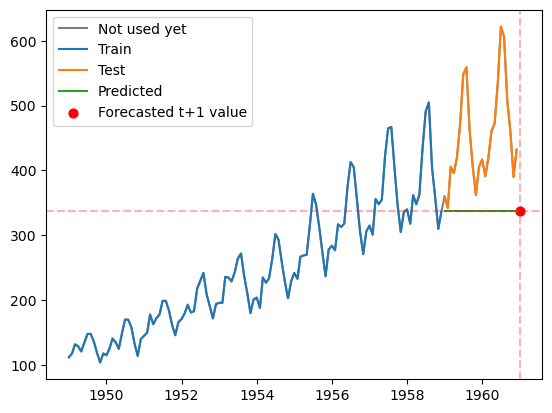

In [28]:
# Create a time-series cross-validator with 5 splits
time_series_splits = TimeSeriesSplit(n_splits=5)

# This variable will hold the place of the first point that will be predicted in the first iteration
test_start= list(time_series_splits.split(data))[0][1][0]

# Initialize prediction list and RMSE list
y_pred_all = []
rmse_all= []

# Loop through the splits
# Time_series_splits.split(data) have in each iteration two lists one for the indices of all train points and the other is for the indices of all test points in this iteration
for train_index, test_index in time_series_splits.split(data):
    y_pred= []
    # Get the train data and test data for this split (iteration) from their indices
    train, test = data.iloc[train_index], data.iloc[test_index]

    # Make naive forecast by repeating the last value of the training set for the length of the test set
    y_pred = [train["Passengers"].iloc[-1]] * len(test)

    # Add the prediction of this iteration (split) to the overall prediction
    y_pred_all.append(y_pred)

    # Calculate the root mean squared error (RMSE) for this split
    rmse = mean_squared_error(test["Passengers"], y_pred, squared=False)

    # Add the current iteration RMSE to the RMSE list
    rmse_all.append(rmse)

    # Predict the value of the next point after the test portion (t+1)
    forecast_t_plus_1 = train["Passengers"].iloc[-1]

    # Visualize each iteration
    # Plot the original data with gray color and it will be overridden with train and test portions and the remaining part will be the part that we didn't use in this iteration
    plt.plot(data.index, data["Passengers"], color="gray", label="Not used yet")
    # Plot the train data
    plt.plot(data.index[train_index], train["Passengers"], label= "Train")
    # Plot the test data
    plt.plot(data.index[test_index], test["Passengers"], label= "Test")
    # Plot the predicted data
    plt.plot(data.index[test_index], y_pred, label= "Predicted")

    # Define new index to add the index of the next point to it to visualize it
    new_index = pd.date_range(start=train.index.min(), end=test.index.max()+pd.Timedelta(days=31), freq="MS")
    # Scatter the predicted value of t+1 and highlight its location by vertical and horizontal dashed lines
    plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
    plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
    plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

    plt.legend()

    plt.show()

### <span style="color:#cccc00">Cross validation for all data</span>

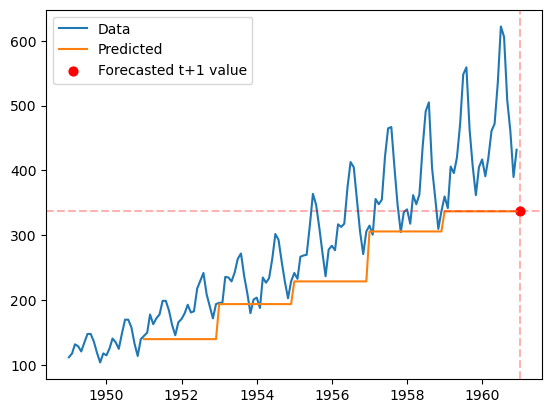

Average vaue for RMSE: 83.59695199628206
Predicted value for t+1: 337


In [29]:
# Concatenate the predicted values from all splits
y_pred_all = np.concatenate(y_pred_all)

# Plot the original
plt.plot(data.index, data["Passengers"], label="Data")
#Plot the predicted data starting from the first place was predicted in the first iteration
plt.plot(data.index[test_start:], y_pred_all, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

plt.legend()
plt.show()

# Calculate the average RMSE
avg_rmse= np.mean(rmse_all)

# Print the RMSE
print("Average vaue for RMSE:", avg_rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)

<span style= 'color: #ff5555; font-weight:bold'>Pros: 

<span style= 'color: #55ff55'>Provides a more robust estimate of model performance than fixed partition. Helps to avoid overfitting or underfitting.

<span style= 'color: #ff5555; font-weight:bold'>Cons: 

<span style= 'color: #55ff55'>Can be computationally expensive, especially for large datasets. Results may vary depending on the number of folds and the choice of validation metric.

### <span style="color:#cccc00">Conclusion</span>

The naïve forecast simply uses the most recent observation as the prediction for all future time periods. As a result, the naïve forecast produces a flat, horizontal line that is the same as the last observed value in the training data.

<span style= 'color: #ff5555; font-weight:bold;'>Pros:

The naïve forecast is a very simple forecasting method that requires no model fitting or complex calculations.

It can serve as a baseline against which to compare more complex forecasting models.

It is useful when the time series being forecasted has no clear trend or seasonality, as it can produce reasonable forecasts in such cases.

<span style= 'color: #ff5555; font-weight:bold;'>Cons:

The naïve forecast assumes that the future values of the time series will be the same as the most recent observed value, which may not always be accurate.

It does not take into account any underlying patterns or trends in the time series, and may perform poorly if the time series has strong trends or seasonality.

It is not useful for long-term forecasting, as it simply repeats the most recent observed value without considering any changes in the underlying data generating process.

<span style= 'color: #ff5555; font-weight:bold;'>Failures of simple moving average:

In this dataset, the Naïve Forecast method produces a constant prediction line, which is the last observed value in the training set. As we saw earlier, the air passenger dataset has a clear increasing trend and seasonality, which means that the Naïve Forecast method is not well-suited for this particular dataset.

<span style= 'color: #ff5555; font-weight:bold;'>Overall, the naïve forecast is a simple and useful forecasting method, but its accuracy depends heavily on the underlying properties of the time series being forecasted.

## <span style="color:#cccc00"><strong>(3) Weighted Moving Average (WMA)</strong><span>

* <span style= 'color: #ff5555; font-weight:bold'>Here we want to find the best window size so we'll define some window sizes and calculate the moving average over them and keep the one with the lowest <span style="color:#77aa77">RMSE</span></span>

* <span style= 'color: #ff5555; font-weight:bold'>We'll make the weight of each observation equal to its position in the window, as we consider <span style="color:#77aa77">more recent data is more valiable and has more effect on the future predections</span></span>

In [30]:
# This function takes a window size and the data and gives the WMA
def sliding_weighted_average(data, window_size):
    # Defining the weights where the weight of each observation is equal to its position in the window
    weights= np.array([i for i in range(window_size)])
    # Normalizing the weights to make their sum equal to 1
    weights= weights/np.sum(weights)
    # Initialize a list of the average values that will be returned
    weighted_averages = []
    # Loop over the data
    for i in range(len(data)):
        # Add nans to the average values if there is no sufficient previous data
        if i < window_size:
            weighted_averages.append(np.nan)
        # If previous data is sufficient calculate the average for the next n elements where n= window size
        else:
            # Add the calculated average to a list to be returned
            weighted_averages.append(np.average(data[i-window_size:i], weights=weights))
    # Return the averages list
    return weighted_averages

In [31]:
# This function takes data and window size range and calculate the best weighted average with thee minimum RMSE
def find_best_weigted_avg(data, window_sizes):
    # Initialize variables (best_window_size, best_weigted_avg, best_rmse)
    # We initialized best_rmse as infinity to be able to get the first RMSE value when performing (rmse < best_rmse)
    best_window_size = None
    best_weigted_avg= None
    best_rmse = float('inf')
    # Loop over all window sizes
    for window_size in window_sizes:
        # Calculate the WMA for the current window size
        weighted_averages = sliding_weighted_average(data, window_size)
        # Calculate the RMSE value of the recently calculated weighted_averages
        rmse = mean_squared_error(data[window_size:], weighted_averages[window_size:], squared= False)
        # Check if there is better result (with lower RMSE)
        if rmse < best_rmse:
            best_rmse = rmse
            best_window_size = window_size
            best_weigted_avg= weighted_averages
    return best_window_size, best_weigted_avg, best_rmse

In [32]:
# Get the best weighted average values and their corresponding window size and RMSE value
window_size, weighted_avg, rmse= find_best_weigted_avg(data["Passengers"], range(3, len(data)//2))

In [33]:
rmse

38.88030975953813

In [34]:
window_size

3

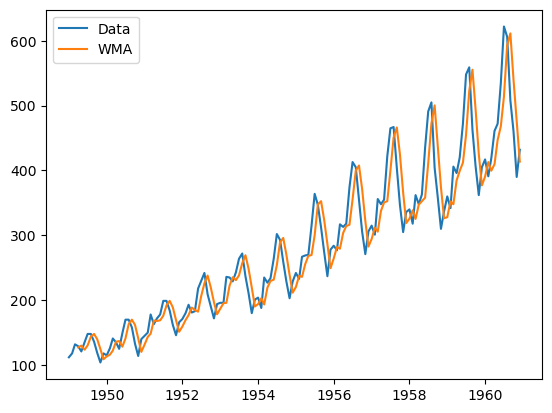

In [35]:
# Visualize calculated WMA with best window size
plt.plot(data.index, data['Passengers'],label='Data')
plt.plot(data.index, weighted_avg, label='WMA')
plt.legend()
plt.show()

### Predection using WMA

In [36]:
# Initialize the weights
weights = np.array([i for i in range(window_size)])
# Normalize the weights
weights = weights/np.sum(weights)
#Initialize the result
result = 0

# Calcuate the weighted average of the last n elements where n= window size
result= np.average(data["Passengers"].iloc[len(data["Passengers"]) - window_size: ], weights=weights)

print("Next predicted value = ", result)

Next predicted value =  418.0


#### Visualize t+1 prediction using the last n elements (n= best window size) 

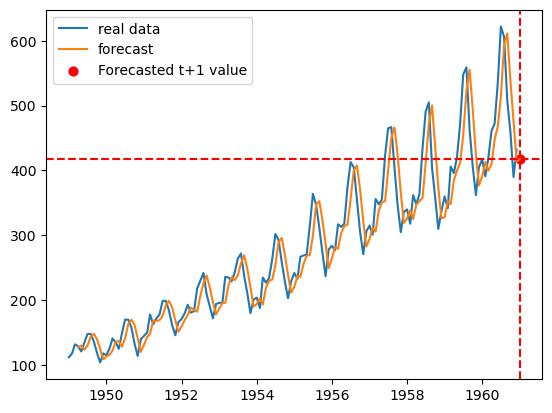

RMSE: 38.88030975953813
Predicted value for t+1: 418.0


In [37]:
# Add the predicted value of t+1 to weighted_avg list
weighted_avg.append(result)

# Visualize the predicted value of t+1 w.r.t the original data and the weighted average values
ax= plt.subplot()
# Plot the original data
ax.plot(data.index, data["Passengers"],label = 'real data')
# Define new index by adding another month to the end of the original index (t+1)
new_index = pd.date_range(start=data.index.min(), end=data.index.max()+pd.Timedelta(days=31), freq="MS")
# Plot the weighted average (forcasted) data
ax.plot(new_index, weighted_avg, label = 'forecast')

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
ax.scatter(new_index[-1], weighted_avg[-1], color= 'red', s=[40], label= 'Forecasted t+1 value')
ax.axhline(y=weighted_avg[-1], color='r', linestyle='--')
ax.axvline(x=new_index[-1], color='r', linestyle='--')

ax.legend()

plt.show()

rmse = mean_squared_error(data["Passengers"].iloc[window_size:], weighted_avg[window_size:-1], squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", weighted_avg[-1])

### <span style="color:#cccc00">Fixed Partitioning</span>

* <span style= 'color: #ff5555; font-weight:bold'>Weighted moving Average will be very bad in long term predictions as it will <span style="color:#77aa77">saturate after a period of time to a fixed value</span></span>

* <span style= 'color: #ff5555; font-weight:bold'>we will set the test set size to be 0.25 from the original data so that it will contain about 3 years, <span style="color:#77aa77">to ensure that each period contains a whole number of seasons</span></span>

* <span style= 'color: #ff5555; font-weight:bold'>Here we will use only train and test splits since WMA is a <span style="color:#77aa77">simple time series forecasting method that does not have any hyperparameters to tune</span> so we don't need validation set</span>

In [38]:
# split the data into train and test sets
# We used shuffle= False because we are working with a time series and the order of the data is important
train, test= train_test_split(data, test_size=0.25, shuffle= False)

pred= []
# Add the three predictions that will be nan if we used the test set to the prediction list using the last n elements in the train set and first n-1 elements in the test set
for i in range(window_size):
        pred.append(np.average(data["Passengers"].iloc[len(train)-window_size+i:len(train)+i], weights= weights))

# Loop over the length of the test set
for i in range(len(test)-3):
        # Predict the next value and add it to the prediction list
        pred.append(np.average(pred[i:i+window_size], weights= weights))

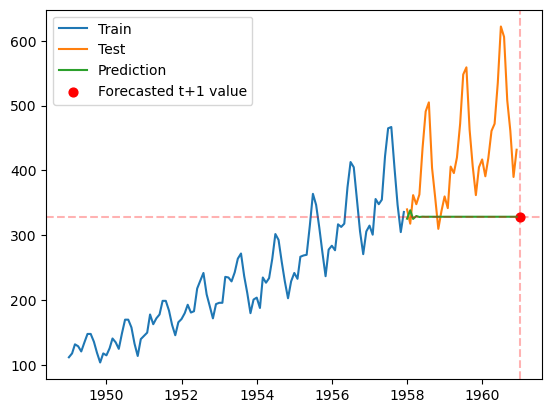

RMSE: 126.89128889540147
Predicted value for t+1: 328.6666666666663


In [39]:
# Plot the train data
plt.plot(train.index, train["Passengers"], label="Train")
# Plot the test data
plt.plot(test.index, test["Passengers"], label="Test")
# Plot the prediction
plt.plot(test.index, pred, label="Prediction")

forecast_t_plus_1= np.average(pred[-window_size: ], weights=weights)

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

plt.legend()
plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(test["Passengers"], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)

### <span style="color:#cccc00">Roll Forward</span>

* <span style="color:#ff5555"><strong>WMA is working with the concept of rolling, but here we will apply the WMA taking our window size as increasing number that increase after predection of the next point starting with a window size 24</strong></span>

* <span style="color:#ff5555"><strong>Note that we have used WMA with a smaller window size earlier which gave better results</strong></span>

* <span style="color:#ff5555"><strong>It will not give good results because the very old data still has effect on the nex data because of the large window size and that will make the values decrease than it should be</strong></span>

In [40]:
pred= []
window_train_size= 24

for i in range(window_train_size, len(data)):
    train= data["Passengers"].iloc[:i]
    weights_n= np.array([i for i in range(i)])
    weights_n= weights_n/ np.sum(weights_n)

    pred.append(np.average(train, weights=weights_n))

# Forecast the value at t+1
forecast_t_plus_1= np.average(data["Passengers"], weights=np.array([i for i in range(len(data))])/ np.sum(list(range(len(data)+1))))

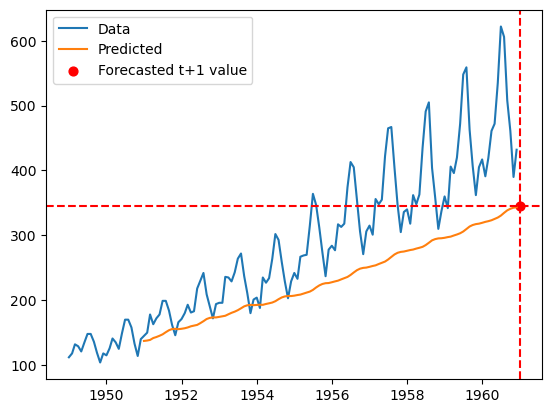

RMSE: 98.34552876624039
Predicted value for t+1: 344.5138888888889


In [41]:
plt.plot(data.index, data["Passengers"], label="Data")
plt.plot(data[24:].index, pred, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()
plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(data["Passengers"].values[24:], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)

### <span style="color:#cccc00">Cross validation</span>

<span style= 'color: #ff5555; font-weight:bold'>Here we will face the same problem we faced in the fixed partitioning that is Weighted moving Average will be very bad in long term predictions as it will <span style="color:#77aa77">saturate after a period of time to a fixed value</span></span>

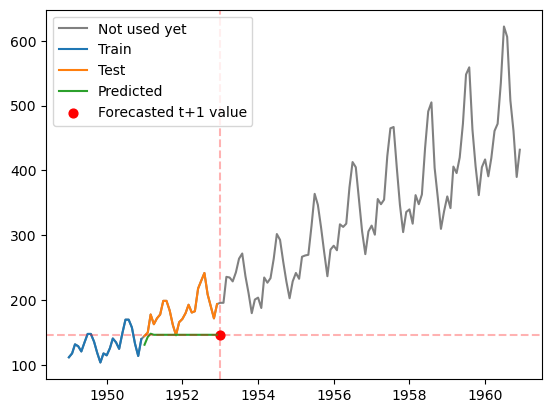

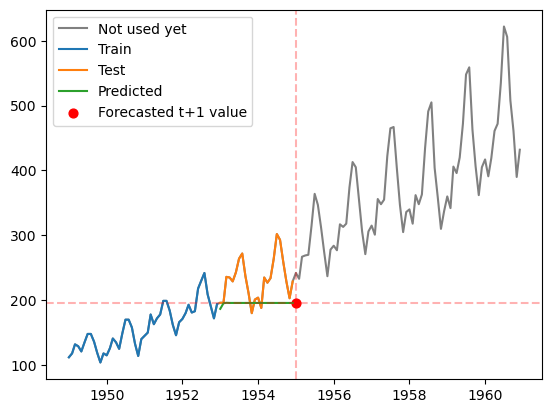

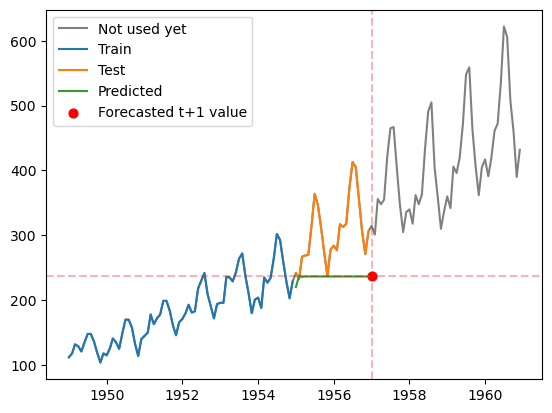

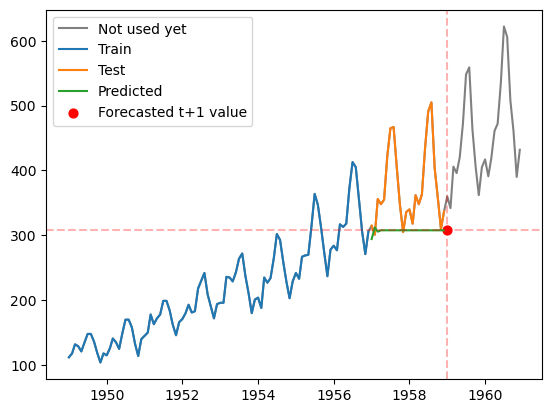

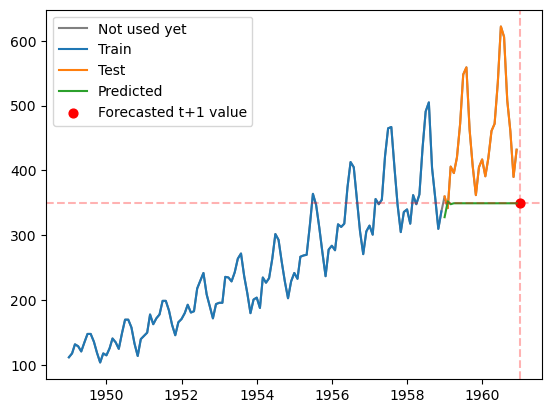

In [42]:
# Create a time-series cross-validator with 5 splits
time_series_splits = TimeSeriesSplit(n_splits=5)

# Initialize predection list and RMSE list
y_pred_all = []
rmse_all= []

# This variable will hold the place of the first point that will be predicted in the first iteration
test_start= list(time_series_splits.split(data))[0][1][0]

# Loop through the splits
# Time_series_splits.split(data) have in each iteration two lists one for the indices of all train points and the other is for the indices of all test points in this iteration
for train_index, test_index in time_series_splits.split(data):
    y_pred= []
    # Get the train data and test data for this split (iteration) from their indices
    train, test = data.iloc[train_index], data.iloc[test_index]
    
    # Add the three predictions that will be nan if we used the test set to the prediction list using the last n elements in the train set and first n-1 elements in the test set
    for i in range(window_size):
        y_pred.append(np.average(data["Passengers"].iloc[len(train)-window_size+i:len(train)+i], weights= weights))

    # Predect the values during the test period one by one
    for i in range(window_size ,len(test)):
        weights_n= np.array([i for i in range(i)])
        weights_n= weights_n/ np.sum(weights_n)

        y_pred.append(np.average(y_pred, weights=weights_n))
    
    # Add the prediction of this iteration (split) to the over all prediction
    y_pred_all.append(y_pred)

    # Calculate the root mean squared error (RMSE) for this split
    rmse = mean_squared_error(test["Passengers"], y_pred, squared=False)

    # Add the cuurent iteration RMSE to the RMSE list
    rmse_all.append(rmse)

    # Predict the value of the next point after the test portion (t+1)
    forecast_t_plus_1= np.average(y_pred, weights=np.array([i for i in range(len(y_pred))])/ np.sum(list(range(len(y_pred)+1))))

    # Visualize each iteration
    # Plot the original data with gray color and it will be overrided with train and test portions and the remaining part will be the part that we didn't use in this iteration
    plt.plot(data.index, data["Passengers"], color="gray", label="Not used yet")
    # Plot the train data
    plt.plot(data.index[train_index], train["Passengers"], label= "Train")
    # Plot the test data
    plt.plot(data.index[test_index], test["Passengers"], label= "Test")
    # Plot the predicted data
    plt.plot(data.index[test_index], y_pred, label= "Predicted")

    # Define new index to add the index of the next point to it to visualize it
    new_index = pd.date_range(start=train.index.min(), end=test.index.max()+pd.Timedelta(days=31), freq="MS")
    # Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
    plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
    plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
    plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

    plt.legend()

    plt.show()


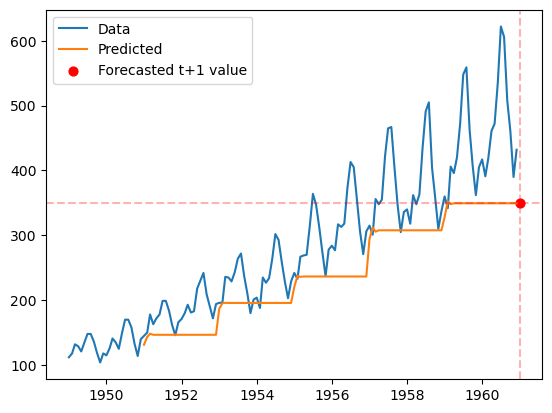

Average vaue for RMSE: 78.70875646444276
Predicted value for t+1: 349.44444444444446


In [43]:
# Concatenate the predicted values from all splits
y_pred_all = np.concatenate(y_pred_all)

# Plot the original
plt.plot(data.index, data["Passengers"], label="Data")
#Plot the predicted data starting from the first place was predicted in the first iteration
plt.plot(data.index[test_start:], y_pred_all, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1, color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1, color='r', linestyle='--', alpha= 0.3)
plt.axvline(x=new_index[-1], color='r', linestyle='--', alpha= 0.3)

plt.legend()
plt.show()

# Calculate the average RMSE
avg_rmse= np.mean(rmse_all)

# Print the RMSE
print("Average vaue for RMSE:", avg_rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1)

## <span style="color:#cccc00">Simple Linear Regression Model</span>

### <span style="color:#cccc00">Fixed Partitioning</span>

* <span style= 'color: #ff5555; font-weight:bold'>Since the data has a linear trend <span style="color:#77aa77">Linear Regression will detect it easily</span>, but 
due to the fluctuations it will give us <span style="color:#77aa77">high RMSE</span></span> 

* <span style= 'color: #ff5555; font-weight:bold'>Here we will use only train and test splits since the OLS model<span style="color:#77aa77"> have no tunable hyperparameters</span> so we don't need validation set</span> 

In [44]:
# Add time column to represent the index of each data value
data["time"]= [i for i in range(len(data))]
# Add intercept column to represent the added value to the independent variable
data['intercept']= 1

# Split the data into train and test data
# We used shuffle= False because we are working with a time series and the order of the data is important
train, test= train_test_split(data, test_size= 0.25, shuffle=False)

# Create OLS model that will use "time" and "intercept" columns as predectors
lm= sm.OLS(train["Passengers"], train[["time", "intercept"]])

# Fit the model to the training data
results= lm.fit()

# Print the statistical measures and information about the fitted model
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Passengers   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.831
Method:                 Least Squares   F-statistic:                     526.7
Date:                Fri, 07 Apr 2023   Prob (F-statistic):           6.40e-43
Time:                        00:52:16   Log-Likelihood:                -536.80
No. Observations:                 108   AIC:                             1078.
Df Residuals:                     106   BIC:                             1083.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
time           2.4928      0.109     22.949      0.000       2.277       2.708
intercept     97.5350      6.726     14.501      0.000      84.200     110.870
==============================================================================
Omnibus:                       13.621   Durbin-Watson:                   0.541
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               15.626
Skew:                           0.739   Prob(JB):                     0.000404
Kurtosis:                       4.135   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* <span style= 'color: #ff5555; font-weight:bold'>The value of P>|t| equals 0.00 which is <span style="color:#77aa77">significant</span>, so a <span style="color:#77aa77">trend exists</span></span>

In [45]:
# predict the values of the test set
pred= results.predict(test[["time", "intercept"]])

# Create a small data frame that represents the next data point to be predicted (data at t+1)
t_plus_1= pd.DataFrame({"time": [len(data)], "intercept": [1]})

# Forecast the value at t+1
forecast_t_plus_1= results.predict(t_plus_1[["time", "intercept"]])

##### Visualize predictions

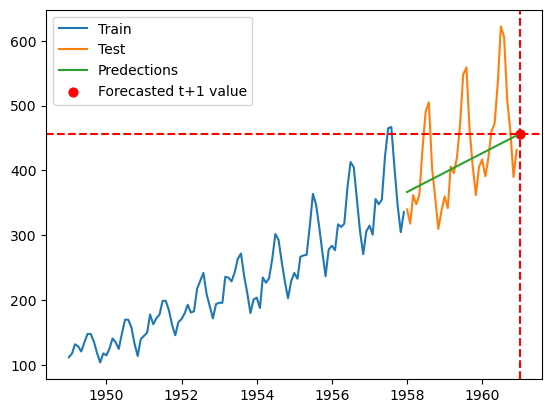

RMSE: 70.6370708178377
Predicted value for t+1: 456.4937567680002


In [46]:
# Plot the training data
plt.plot(train.index, train["Passengers"], label= "Train")
# Plot the test data
plt.plot(test.index, test["Passengers"], label= "Test")
# Plot the predictions
plt.plot(test.index, pred, label= "Predections")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1[0], color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1[0], color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()

plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(test["Passengers"], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1[0])

<span style="color:#ff5555"><strong>Now we will train our model on the whole data set including the test set and forecast the next point (t+1)</strong></span>

In [47]:
# Create OLS model that will use "time" and "intercept" columns as predectors
lm= sm.OLS(data["Passengers"], data[["time", "intercept"]])

# Fit the model to the training data
results= lm.fit()

# predict the values of the data set
pred= results.predict(data[["time", "intercept"]])

# Create a small data frame that represents the next data point to be predicted (data at t+1)
t_plus_1= pd.DataFrame({"time": [len(data)], "intercept": [1]})

# Forecast the value at t+1
forecast_t_plus_1= results.predict(t_plus_1[["time", "intercept"]])

##### Visualize predictions

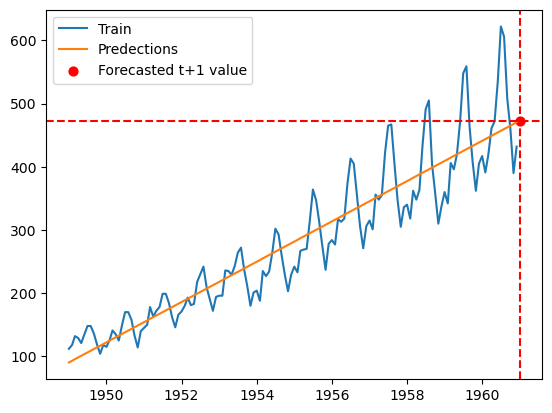

RMSE: 45.73619391613882
Predicted value for t+1: 472.94444444444446


In [48]:
# Plot the training data
plt.plot(data.index, data["Passengers"], label= "Train")

# Plot the predictions
plt.plot(data.index, pred, label= "Predections")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1[0], color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1[0], color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()

plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(data["Passengers"], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1[0])

### <span style="color:#cccc00">Roll Forward</span>

<span style= 'color: #ff5555; font-weight:bold'>It will give better performance than fixed partitioning, but the model still has high RMSE due to the high fluctuations
</span> 

In [49]:
pred= []
window_train_size= 24

for i in range(window_train_size, len(data)):
    lm= sm.OLS(data["Passengers"].values[:i], data[["time", "intercept"]].values[:i])
    model= lm.fit()
    pred.append(model.predict( data[["time", "intercept"]].values[i:i+1]))

# Create a small data frame that represents the next data point to be predicted (data at t+1)
t_plus_1= pd.DataFrame({"time": [len(data)], "intercept": [1]})

# Forecast the value at t+1
forecast_t_plus_1= model.predict(t_plus_1[["time", "intercept"]])

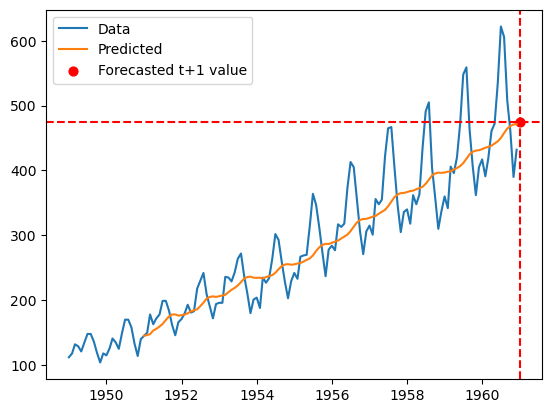

RMSE: 50.61373191040588
Predicted value for t+1: 474.03804294297254


In [50]:
plt.plot(data.index, data["Passengers"], label="Data")
plt.plot(data[24:].index, pred, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1[0], color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1[0], color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()
plt.show()

# Calculate RMSE for the test period
rmse = mean_squared_error(data["Passengers"].values[24:], pred, squared=False)

# Print the RMSE
print("RMSE:", rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1[0])

### <span style="color:#cccc00">Cross validation</span>

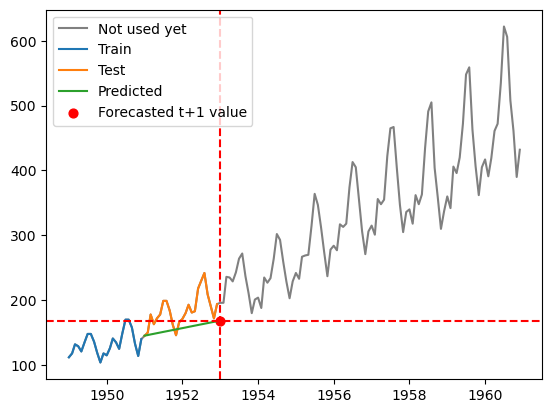

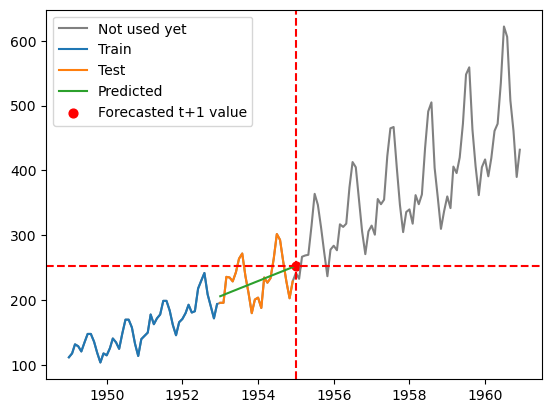

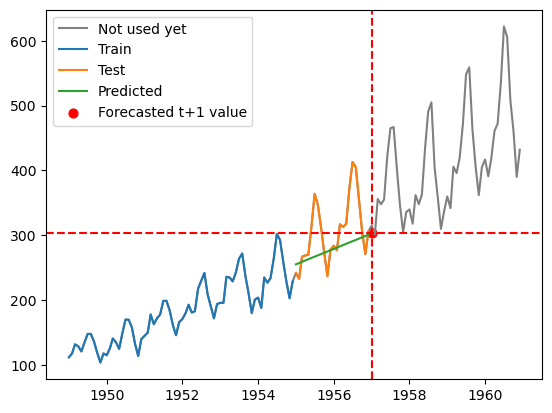

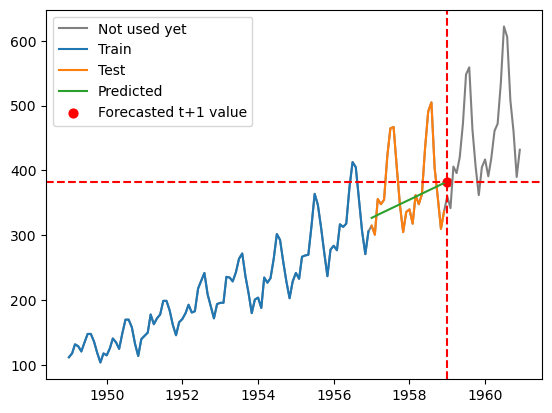

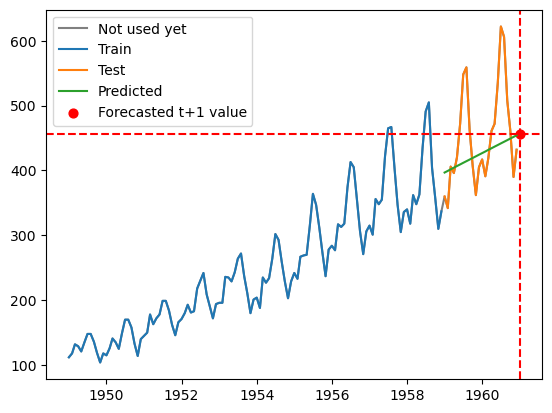

In [51]:
# Create a time-series cross-validator with 5 splits
time_series_splits = TimeSeriesSplit(n_splits=5)

# Initialize predection list and RMSE list
y_pred_all = []
rmse_all= []

# This variable will hold the place of the first point that will be predicted in the first iteration
test_start= list(time_series_splits.split(data))[0][1][0]

# Loop through the splits
# time_series_splits.split(data) have in each iteration two lists one for the indices of all train points and the other is for the indices of all test points in this iteration
for train_index, test_index in time_series_splits.split(data):

    # get the train data and test data for this split (iteration) from their indices
    train, test = data.iloc[train_index], data.iloc[test_index]
    
    # Create a linear regression model
    lm = sm.OLS(train["Passengers"], train[["time", "intercept"]])

    # Fit the linear regression model on the training data
    model= lm.fit()

    # Predict the values for the test data
    y_pred = model.predict(test[["time", "intercept"]])
    y_pred_all.append(y_pred)

    # Calculate the root mean squared error (RMSE)
    rmse = mean_squared_error(test["Passengers"], y_pred, squared=False)

    # Add the cuurent iteration RMSE to the RMSE list
    rmse_all.append(rmse)

    # Create a small data frame that represents the next data point after the test portion to be predicted (data at t+1)
    t_plus_1= pd.DataFrame({"time": [len(train)+len(test)], "intercept": [1]})

    # Predict the value of the next point after the test portion (t+1)
    forecast_t_plus_1= model.predict(t_plus_1[["time", "intercept"]])

    # Visualize each iteration
    # Plot the original data with gray color and it will be overrided with train and test portions and the remaining part will be the part that we didn't use in this iteration
    plt.plot(data.index, data["Passengers"], color="gray", label="Not used yet")
    # Plot the train data
    plt.plot(data.index[train_index], train["Passengers"], label= "Train")
    # Plot the test data
    plt.plot(data.index[test_index], test["Passengers"], label= "Test")
    # Plot the predicted data
    plt.plot(data.index[test_index], y_pred, label= "Predicted")

    # Define new index to add the index of the next point to it to visualize it
    new_index = pd.date_range(start=train.index.min(), end=test.index.max()+pd.Timedelta(days=31), freq="MS")
    # Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
    plt.scatter(new_index[-1], forecast_t_plus_1[0], color= 'red', s=[40], label= 'Forecasted t+1 value')
    plt.axhline(y=forecast_t_plus_1[0], color='r', linestyle='--')
    plt.axvline(x=new_index[-1], color='r', linestyle='--')

    plt.legend()

    plt.show()


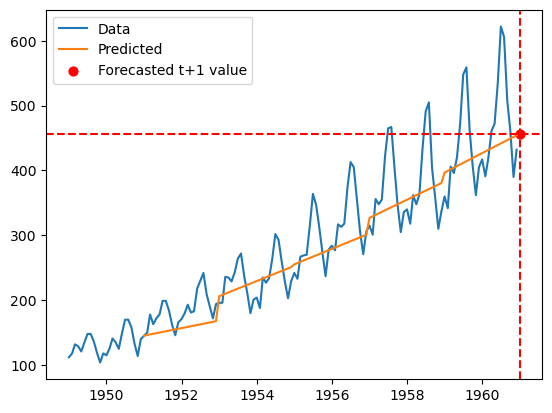

Average vaue for RMSE: 50.75052480306661
Predicted value for t+1: 456.72846841215846


In [52]:
# Concatenate the predicted values from all splits
y_pred_all = np.concatenate(y_pred_all)

# Plot the original
plt.plot(data.index, data["Passengers"], label="Data")
#Plot the predicted data starting from the first place was predicted in the first iteration
plt.plot(data.index[test_start:], y_pred_all, label="Predicted")

# Scatter the predicted value of t+1 and heighlite its location by vertical and horizontal dashed lines
plt.scatter(new_index[-1], forecast_t_plus_1[0], color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=forecast_t_plus_1[0], color='r', linestyle='--')
plt.axvline(x=new_index[-1], color='r', linestyle='--')

plt.legend()
plt.show()

# Calculate the average RMSE
avg_rmse= np.mean(rmse_all)

# Print the RMSE
print("Average vaue for RMSE:", avg_rmse)

# Print the predicted values for t+1
print("Predicted value for t+1:", forecast_t_plus_1[0])

# Decomposition

In [62]:
df = pd.read_csv('airline-passengers.csv', index_col='Month', parse_dates=True)

### Our aim is to understand and identify different variations so that we can easily predict the future variations separately and combine them together either additively or multiplicatively.

### Reviewing the line plot for tha data, it suggests that there may be a linear trend. 
### There is also seasonality, but the amplitude (height) of the cycles appears to be increasing, suggesting that it is multiplicative.

# Classical Decomposition

## Fixed Partitioning 

In [63]:
# Split the data into train and test sets
train, test= train_test_split(df, test_size=0.25, shuffle= False)
print(train.shape)
print(test.shape)

(108, 1)
(36, 1)


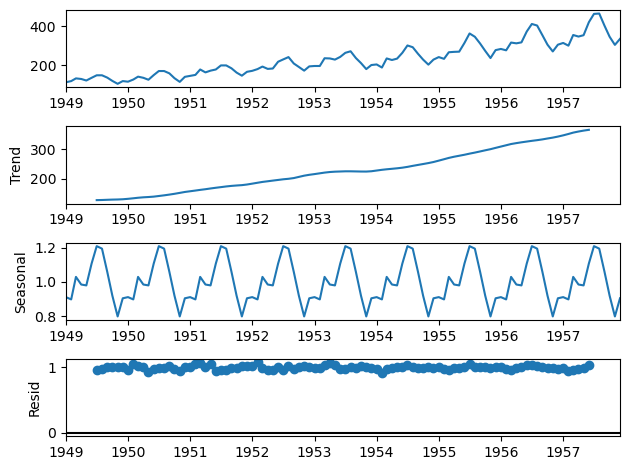

In [64]:
# Classical decomposition with multiplicative model 
class_decomp_mul = seasonal_decompose(train, model='multiplicative', period=12)
class_decomp_mul.plot()
plt.show()

### To able to predict using a multiplicative model we need calculate the trend component. • 𝑌𝑡 = 𝑇𝑡. 𝐶𝑡. 𝑆𝑡. 𝑅
### we predict trend component using linear regression. 
### trend = coef + t * std_err
### to get the forcast multiply trend by seasonality index for t


In [65]:
seasonal_indices = class_decomp_mul.seasonal

We choose intercept values after trying different values and see rmse

In [68]:
train_df = train.copy()
train_df['intercept'] = 1
train_df["time"]= [i for i in range(len(train_df))]
lm = sm.OLS(train_df['Passengers'],train_df[["time", "intercept"]])
model = lm.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Passengers   R-squared:                       0.832
Model:                            OLS   Adj. R-squared:                  0.831
Method:                 Least Squares   F-statistic:                     526.7
Date:                Fri, 07 Apr 2023   Prob (F-statistic):           6.40e-43
Time:                        01:01:18   Log-Likelihood:                -536.80
No. Observations:                 108   AIC:                             1078.
Df Residuals:                     106   BIC:                             1083.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
time           2.4928      0.109     22.949      0.000       2.277       2.708
intercept     97.5350      6.726     14.501      0.000      84.200     110.870
==============================================================================
Omnibus:                       13.621   Durbin-Watson:                   0.541
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               15.626
Skew:                           0.739   Prob(JB):                     0.000404
Kurtosis:                       4.135   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [69]:
test_df = test.copy()
test_df['intercept'] = 1
test_df["time"]= [i for i in range(len(train),len(df))]
trend= model.predict(test_df[["time", "intercept"]])
pred = [trend[i]*seasonal_indices[i] for i in range(len(test_df))]

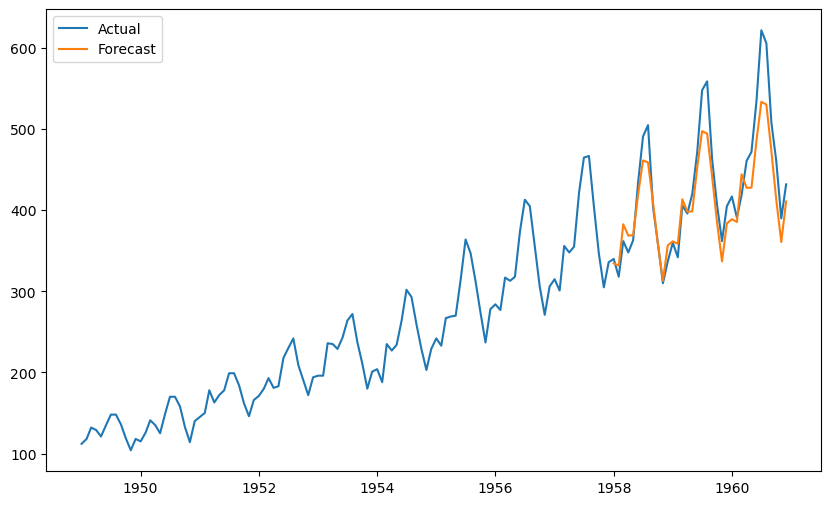

In [70]:
# Plot the original and forecasted values for the test set
plt.figure(figsize=(10, 6))
plt.plot(df.index,df, label='Actual')
plt.plot(test.index,pred, label='Forecast')
plt.legend()
plt.show()

In [71]:
rmse = mean_squared_error(test, pred, squared=False)
print('RMSE:', rmse)

RMSE: 33.26640327101954


## Roll Forward Partitioning

In [75]:
pred= []
window_train_size= 24

data = df.copy()
data["time"]= [i for i in range(len(data))]
data['intercept']= 1

for i in range(window_train_size, len(df)):
    class_decomp_mul = seasonal_decompose(data["Passengers"].values[:i], model='multiplicative', period=12)
    seasonal_indices = class_decomp_mul.seasonal
    lm= sm.OLS(data["Passengers"].values[:i], data[["time", "intercept"]].values[:i])
    model= lm.fit()
    trend = model.predict(data[["time", "intercept"]].values[i:i+1])
    pred.append(trend*seasonal_indices[i-1])

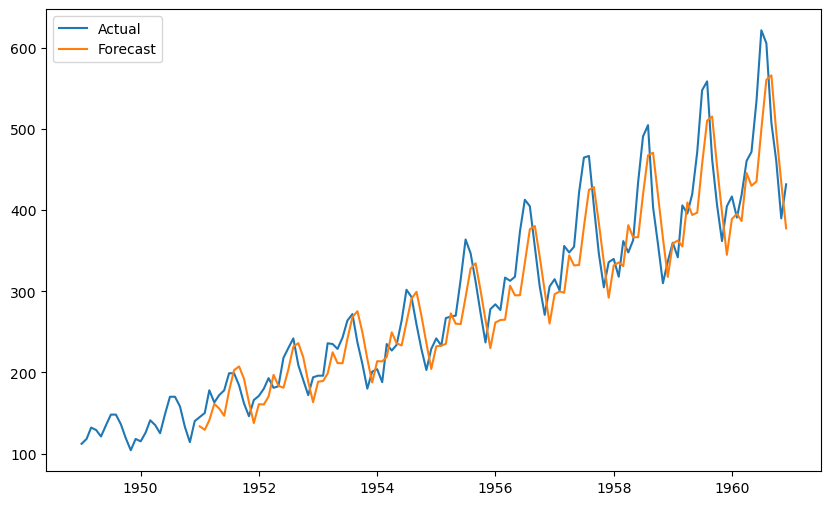

In [77]:
# Plot the original and forecasted values for the test set
plt.figure(figsize=(10, 6))
plt.plot(df.index,df, label='Actual')
plt.plot(df[24:].index,pred, label='Forecast')
plt.legend()
plt.show()

In [78]:
# Calculate RMSE for the test period
rmse = mean_squared_error(df.values[24:], pred, squared=False)
print('RMSE:', rmse)

RMSE: 39.5057198952283


# STL Decomposition

## Multiplicative STL

In [80]:
train, test= train_test_split(df, test_size=0.25, shuffle= False)

### taking log to convert data to additive instead of multiplicative to enable us use stl decomposition 
### we use boxcox transformation with lambda 0 to do this

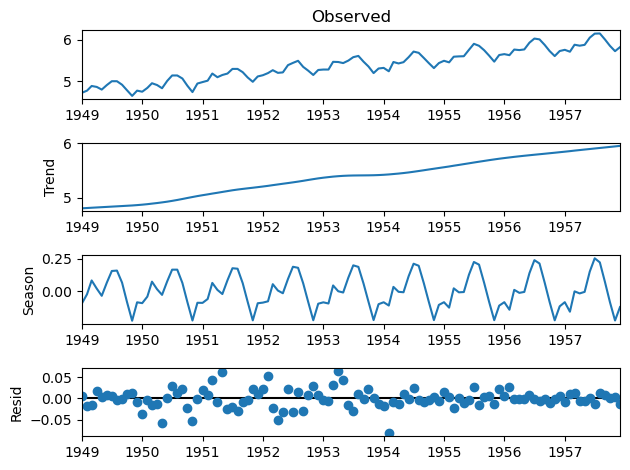

In [82]:
# STL mul decomposition
train['Passengers']= boxcox(train['Passengers'], lmbda=0)
stl = STL(train, seasonal=13)
stl_decomp = stl.fit()
stl_decomp.plot()
plt.show()

function seems to have captured the three components well. we see the residuals having a higher volatility in the earlier and later years.

### we return it to multiplicative by taking exponential

In [83]:
seasonal_indices = stl_decomp.seasonal
seasonal_indices = np.exp(seasonal_indices) 

In [85]:
train_df = train.copy()
train_df['intercept'] = 1
train_df["time"]= [i for i in range(len(train_df))]
test_df = test.copy()
test_df['intercept'] = 1
test_df["time"]= [i for i in range(len(train),len(df))]
lm = sm.OLS(train_df['Passengers'],train_df[["time", "intercept"]])
model = lm.fit()

trend= model.predict(test_df[["time", "intercept"]])
pred = [trend[i]*seasonal_indices[i] for i in range(len(test_df))]

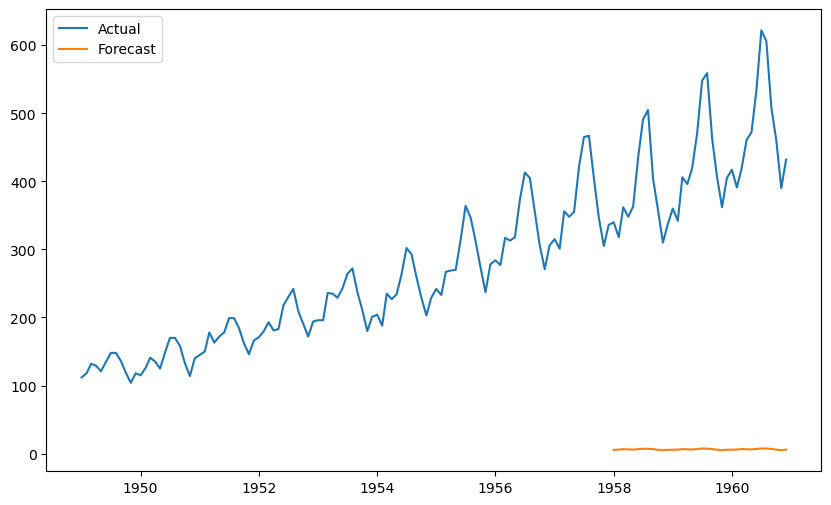

In [86]:
# Plot the original and forecasted values for the test set
plt.figure(figsize=(10, 6))
plt.plot(df.index,df, label='Actual')
plt.plot(test.index,pred, label='Forecast')
plt.legend()
plt.show()

In [87]:
rmse = mean_squared_error(test, pred, squared=False)
print('RMSE:', rmse)

RMSE: 429.3666037969563


## Additive STL

In [ ]:
train, test= train_test_split(df, test_size=0.3, shuffle= False)

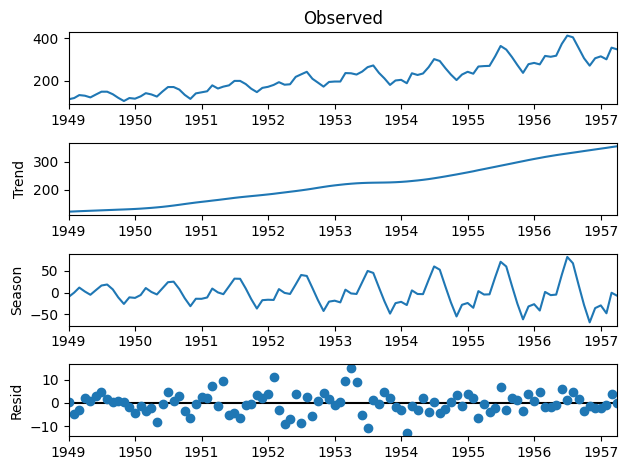

In [ ]:
stl = STL(train, seasonal=13)
stl_decomp = stl.fit()
stl_decomp.plot()
plt.show()

In [ ]:
seasonal_indices = stl_decomp.seasonal

In [ ]:
train_df = train.copy()
train_df['intercept'] = 1
train_df["time"]= [i for i in range(len(train_df))]
test_df = test.copy()
test_df['intercept'] = 1
test_df["time"]= [i for i in range(len(train),len(df))]
lm = sm.OLS(train_df['#Passengers'],train_df[["time", "intercept"]])
model = lm.fit()

trend= model.predict(test_df[["time", "intercept"]])
pred = [trend[i]+seasonal_indices[i] for i in range(len(test_df))]

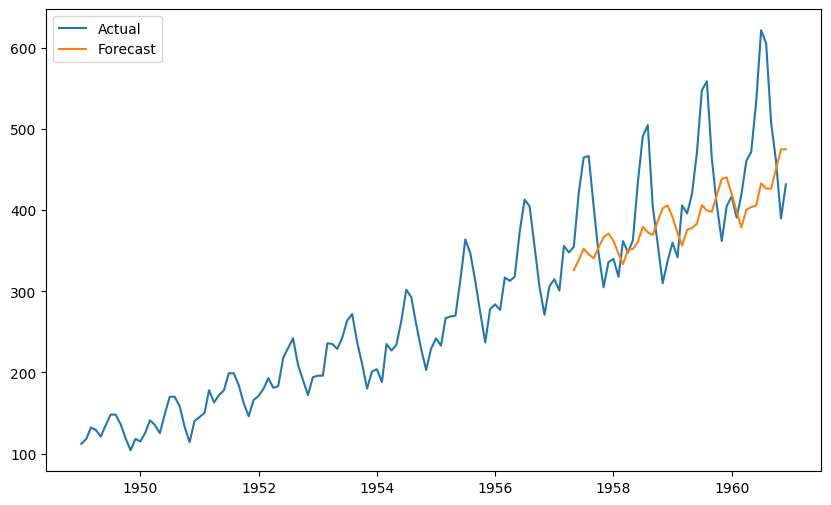

In [ ]:
# Plot the original and forecasted values for the test set
plt.figure(figsize=(10, 6))
plt.plot(df.index,df, label='Actual')
plt.plot(test.index,pred, label='Forecast')
plt.legend()
plt.show()

In [ ]:
rmse = mean_squared_error(test, pred, squared=False)
print('RMSE:', rmse)

RMSE: 79.5558025292723


Based on our analysis and experimentation with the airline passenger dataset, we can summarize the pros and cons of the two time series decomposition approaches as follows:

# Classical Decomposition:

# Pros:

Easy to understand and implement.
Can handle both additive and multiplicative models.
Decomposes the time series into its four key components: trend, seasonality, cyclicality, and residuals.
Can be useful for identifying long-term trends and seasonal patterns in the data.
# Cons:

Assumes that the components of the time series are independent of each other.
May not work well for complex and irregular time series.
Does not handle trading day or calendar variation automatically.
# STL Decomposition:

# Pros:

Can handle non-linear and non-stationary time series.
Can be useful for identifying local trends and seasonal patterns in the data.
Provides facilities for handling additive and multiplicative decompositions.
Allows for modeling of the residuals through a robust regression.
# Cons:

Can be computationally intensive for large datasets.
Does not handle trading day or calendar variation automatically.
May not work well for time series with irregular patterns or sudden changes in behavior.
Overall, the choice between classical and STL decomposition depends on the nature of the time series being analyzed and the specific goals of the analysis. For simple and regular time series, classical decomposition may be sufficient, while for more complex and irregular time series, STL decomposition may be more appropriate.

# ARIMA and SARIMA

In [ ]:
data= pd.read_csv(r"C:\Users\ihabn\OneDrive\Desktop\airline-passengers.csv")


In [ ]:
data['Month'] = pd.to_datetime(data['Month'])

# Data Visualization

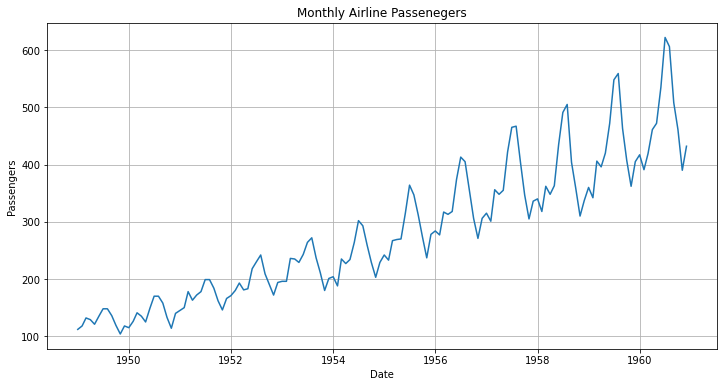

In [ ]:
plt.figure(figsize=(12,6));
plt.plot(data.Month, data.Passengers);
plt.xlabel('Date');
plt.ylabel('Passengers');
plt.title('Monthly Airline Passenegers');
plt.grid()

* <span style='color: darkblue; font-weight:bold'>Here we note that the data is not stationary in variance, trend, and seasonality.</span>

* <span style='color: darkblue; font-weight:bold'>We will make our data stationary in variance first because applying differences could cause time series values to be negative.</span>

# Make the target variance stationary


In [ ]:
data['Passengers_Boxcox'], lam = boxcox(data['Passengers'])

In [ ]:
data.head()

,Month,Passengers,Passengers_Boxcox
0,1949-01-01,112,6.827490
1,1949-02-01,118,6.932822
2,1949-03-01,132,7.161892
3,1949-04-01,129,7.114611
4,1949-05-01,121,6.983787


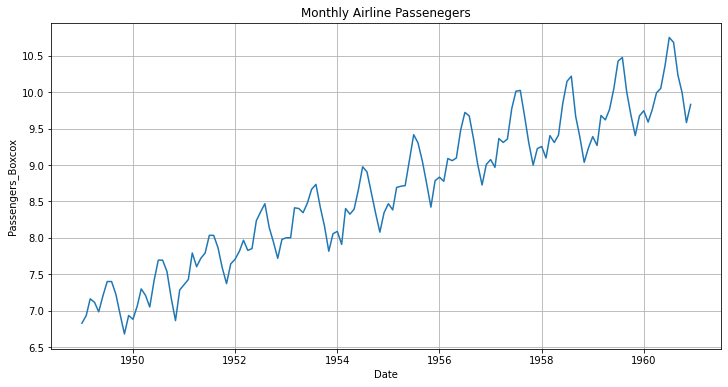

In [ ]:
plt.figure(figsize=(12,6));
plt.plot(data.Month, data.Passengers_Boxcox);
plt.xlabel('Date');
plt.ylabel('Passengers_Boxcox');
plt.title('Monthly Airline Passenegers');
plt.grid()

* <span style='color: darkblue; font-weight:bold'>Here, the data has become stationary in variance, as we can see from the scale of the y-axis.</span>

# Plot acf and pacf

* <span style='color: darkblue; font-weight:bold'>First , without applying the first difference in data.</span>

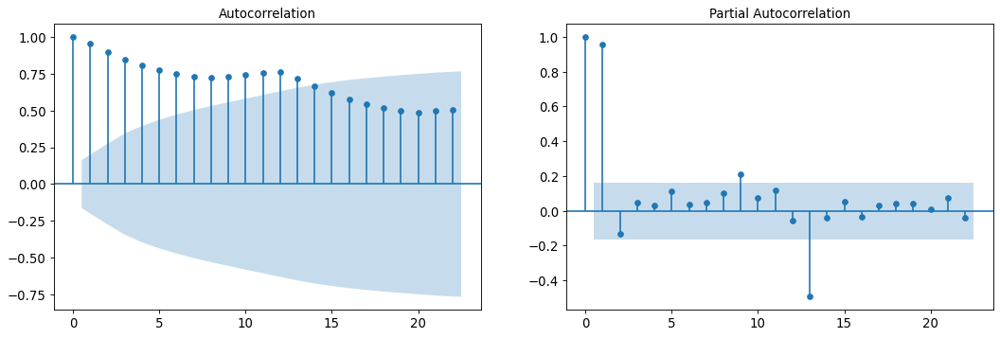

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,5), dpi=80)
plot_acf(data['Passengers_Boxcox'],ax=ax1)
plot_pacf(data['Passengers_Boxcox'], method='ywm',ax=ax2)
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()

* <span style='color: darkblue; font-weight:bold'> With applying the first difference in data.</span>

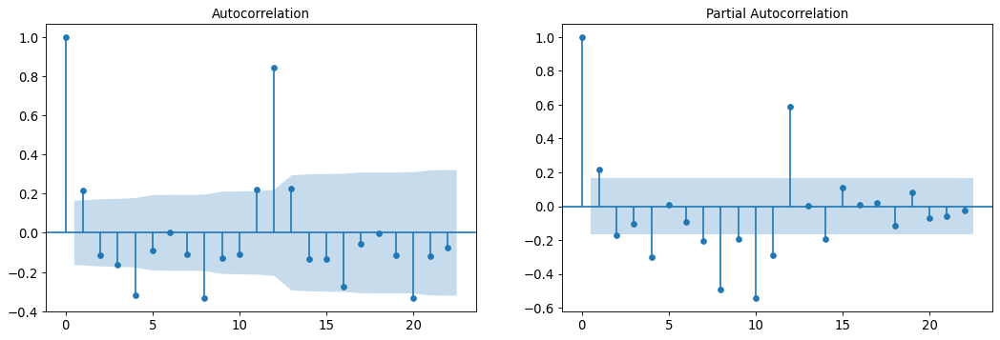

In [ ]:
data["Passenger_diff"] = data["Passengers_Boxcox"].diff()
data.dropna(inplace=True)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,5), dpi=80)
plot_acf(data['Passenger_diff'], ax=ax1)
plot_pacf(data['Passenger_diff'], method='ywm', ax=ax2)
ax1.tick_params(axis='both', labelsize=12)
ax2.tick_params(axis='both', labelsize=12)
plt.show()


* <span style='color: darkblue; font-weight:bold'> It's clear that since ACF declines sharply (within 5% CI of 0 value)
after two lags.</span>

* <span style='color: darkblue; font-weight:bold'> It's clear that since PACF declines sharply (within 5% CI of 0 value)
after two lags.</span>

* <span style='color: darkblue; font-weight:bold'> we note that there is seasonality which ARIMA model is hardly to deal with it so we will deal with SARIMA Model.</span>

# Splitting the data

# Fixed Splitting

In [ ]:
train_size = int(data.shape[0] * 0.75)
data_train, data_test = data.iloc[:train_size,:] , data.iloc[train_size:, :]

# Comparing with Different Models 

* <span style='color: darkblue; font-weight:bold'> AIC.</span>
* <span style='color: darkblue; font-weight:bold'> BIC.</span>
* <span style='color: darkblue; font-weight:bold'> RMSE.</span>
* <span style='color: darkblue; font-weight:bold'> Signifigance of parameters.</span>
* <span style='color: darkblue; font-weight:bold'> signifigance of white noise</span>



* <span style='color: darkblue; font-weight:bold'> First we will try using ARIMA model and we excpect it will be not effective because of seasonality.</span>


In [ ]:
model1 = ARIMA(endog=data_train.Passengers_Boxcox, order=(2,1,2))
              
model1_fit = model1.fit()

# get residuals values for later study
residuals = model1_fit.resid

# summary of fit model
print(model1_fit.summary())

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'
C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'
C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


                               SARIMAX Results                                
Dep. Variable:      Passengers_Boxcox   No. Observations:                  107
Model:                 ARIMA(2, 1, 2)   Log Likelihood                  12.712
Date:                Thu, 06 Apr 2023   AIC                            -15.424
Time:                        23:50:44   BIC                             -2.107
Sample:                             0   HQIC                           -10.026
                                - 107                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2581      0.191      1.350      0.177      -0.117       0.633
ar.L2          0.2352      0.248      0.948      0.343      -0.251       0.722
ma.L1         -0.0950      0.142     -0.672      0.5

In [ ]:
boxcox_forecasts1 = model1_fit.forecast(len(data_test))
forecasts1 = inv_boxcox(boxcox_forecasts1, lam)
print("Test RMSE %.2f" % mean_squared_error(data_test.Passengers,forecasts1, squared=False))

Test RMSE 106.55


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  warnings.warn('No supported index is available.'


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_train['Month'], y=data_train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=data_test['Month'], y=data_test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=data_test['Month'], y=forecasts1, name='Forecast'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text="ARIMA First Model",
                      width=650, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()


* <span style='color: darkblue; font-weight:bold'>As we see from RMSE ARIMA is not a good choice to deal with seasonality .</span>

* <span style='color: darkblue; font-weight:bold'>So Next we will move to SARIMA  .</span>


In [ ]:
model1 = ARIMA(endog=data_train.Passengers_Boxcox, order=(2,1,2), seasonal_order=(3, 1, 3, 4))
              
model1_fit = model1.fit()

# get residuals values for later study
residuals = model1_fit.resid

# summary of fit model
print(model1_fit.summary())


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.



                                        SARIMAX Results                                        
Dep. Variable:                       Passengers_Boxcox   No. Observations:                  107
Model:             ARIMA(2, 1, 2)x(3, 1, [1, 2, 3], 4)   Log Likelihood                  99.323
Date:                                 Thu, 06 Apr 2023   AIC                           -176.645
Time:                                         23:51:24   BIC                           -147.771
Sample:                                              0   HQIC                          -164.953
                                                 - 107                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1977      0.305     -0.648      0.517      -0.796       0

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [ ]:
boxcox_forecasts1 = model1_fit.forecast(len(data_test))
forecasts1 = inv_boxcox(boxcox_forecasts1, lam)
print("Test RMSE %.2f" % mean_squared_error(data_test.Passengers,forecasts1, squared=False))

Test RMSE 41.02


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_train['Month'], y=data_train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=data_test['Month'], y=data_test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=data_test['Month'], y=forecasts1, name='Forecast'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text="SARIMA First Model",
                      width=650, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

* <span style='color: darkblue; font-weight:bold'>As we see SARIMA is much more better dealing with seasonality .</span>

* <span style='color: darkblue; font-weight:bold'>So we try to modify orders to get better results  .</span>


In [ ]:
model2 = ARIMA(endog=data_train.Passengers_Boxcox, order=(2,1,2), seasonal_order=(1, 1, 1, 12))
              
model2_fit = model2.fit()

# get residuals values for later study
residuals = model2_fit.resid

# summary of fit model
print(model2_fit.summary())

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.



                                     SARIMAX Results                                      
Dep. Variable:                  Passengers_Boxcox   No. Observations:                  107
Model:             ARIMA(2, 1, 2)x(1, 1, [1], 12)   Log Likelihood                  99.934
Date:                            Thu, 06 Apr 2023   AIC                           -185.868
Time:                                    23:52:31   BIC                           -168.064
Sample:                                         0   HQIC                          -178.676
                                            - 107                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0342      0.355     -0.096      0.923      -0.730       0.662
ar.L2          0.6139      0.237   

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



In [ ]:
boxcox_forecasts2 = model2_fit.forecast(len(data_test))
forecasts2 = inv_boxcox(boxcox_forecasts2, lam)
print("Test RMSE %.2f" % mean_squared_error(data_test.Passengers,forecasts2, squared=False))

Test RMSE 40.49


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=data_train['Month'], y=data_train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=data_test['Month'], y=data_test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=data_test['Month'], y=forecasts2, name='Forecast'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" SARIMA Second Model",
                      width=650, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

# cross validation


* <span style='color: darkblue; font-weight:bold'>ARIMA MODEL .</span>


In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the time series cross validator
tscv = TimeSeriesSplit(n_splits=5)

# Initialize an empty list to store the RMSE values
rmse_list = []

# Loop over the folds using the time series cross validator
for train_index, test_index in tscv.split(data):
    # Split the data into training and testing sets based on the fold indices
    train = data.iloc[train_index]
    test = data.iloc[test_index]

    # Fit the model to the training data
    #model = ExponentialSmoothing(train.Passengers, trend="additive", seasonal="mul", damped_trend=True,
    #use_boxcox=True,initialization_method="estimated",seasonal_periods=12).fit(optimized=True)
    
    model2 = ARIMA(endog=train.Passengers_Boxcox, order=(2,1,2))
              
    model2_fit = model2.fit()
    
    boxcox_forecasts2 = model2_fit.forecast(len(test))
    forecasts2 = inv_boxcox(boxcox_forecasts2, lam)

    

    ,
    # Make predictions on the testing data
    #preds = model.forecast(test.Passengers.shape[0])

    # Calculate the RMSE and add it to the list
    rmse = mean_squared_error(test.Passengers, forecasts2, squared=False)
    rmse_list.append(rmse)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
    fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
    fig.add_trace(go.Scatter(x=test['Month'], y=forecasts2, name='Triple'))
    fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                          width=1000, title_x=0.5, height=600, xaxis_title='Date',
                          yaxis_title='Passenger ')

    fig.show()


# Calculate the mean of the RMSE values
avg_rmse = np.mean(rmse_list)



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



In [ ]:
print("Average RMSE:", avg_rmse)
print(model2_fit.summary())


Average RMSE: 72.06700164698155
                               SARIMAX Results                                
Dep. Variable:      Passengers_Boxcox   No. Observations:                  120
Model:                 ARIMA(2, 1, 2)   Log Likelihood                  11.884
Date:                Thu, 06 Apr 2023   AIC                            -13.769
Time:                        23:53:50   BIC                              0.127
Sample:                             0   HQIC                            -8.126
                                - 120                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2390      0.183      1.303      0.193      -0.120       0.598
ar.L2          0.2639      0.224      1.176      0.240      -0.176       0.704
ma.L1         -0.084

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the time series cross validator
tscv = TimeSeriesSplit(n_splits=5)

# Initialize an empty list to store the RMSE values
rmse_list = []

# Loop over the folds using the time series cross validator
for train_index, test_index in tscv.split(data):
    # Split the data into training and testing sets based on the fold indices
    train = data.iloc[train_index]
    test = data.iloc[test_index]

    # Fit the model to the training data
    #model = ExponentialSmoothing(train.Passengers, trend="additive", seasonal="mul", damped_trend=True,
    #use_boxcox=True,initialization_method="estimated",seasonal_periods=12).fit(optimized=True)
    
    model2 = ARIMA(endog=train.Passengers_Boxcox, order=(2,1,2),seasonal_order=(3, 1, 3, 4))
              
    model2_fit = model2.fit()
    
    boxcox_forecasts2 = model2_fit.forecast(len(test))
    forecasts2 = inv_boxcox(boxcox_forecasts2, lam)

    

    ,
    # Make predictions on the testing data
    #preds = model.forecast(test.Passengers.shape[0])

    # Calculate the RMSE and add it to the list
    rmse = mean_squared_error(test.Passengers, forecasts2, squared=False)
    rmse_list.append(rmse)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
    fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
    fig.add_trace(go.Scatter(x=test['Month'], y=forecasts2, name='Triple'))
    fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                          width=1000, title_x=0.5, height=600, xaxis_title='Date',
                          yaxis_title='Passenger ')

    fig.show()


# Calculate the mean of the RMSE values
avg_rmse = np.mean(rmse_list)



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:

Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:3

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum L

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is avail

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is avail

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is avail

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the time series cross validator
tscv = TimeSeriesSplit(n_splits=5)

# Initialize an empty list to store the RMSE values
rmse_list = []

# Loop over the folds using the time series cross validator
for train_index, test_index in tscv.split(data):
    # Split the data into training and testing sets based on the fold indices
    train = data.iloc[train_index]
    test = data.iloc[test_index]

    # Fit the model to the training data
    #model = ExponentialSmoothing(train.Passengers, trend="additive", seasonal="mul", damped_trend=True,
    #use_boxcox=True,initialization_method="estimated",seasonal_periods=12).fit(optimized=True)
    
    model2 = ARIMA(endog=train.Passengers_Boxcox, order=(2,1,2),seasonal_order=(3, 1, 3, 4))
              
    model2_fit = model2.fit()
    
    boxcox_forecasts2 = model2_fit.forecast(len(test))
    forecasts2 = inv_boxcox(boxcox_forecasts2, lam)

    

    ,
    # Make predictions on the testing data
    #preds = model.forecast(test.Passengers.shape[0])

    # Calculate the RMSE and add it to the list
    rmse = mean_squared_error(test.Passengers, forecasts2, squared=False)
    rmse_list.append(rmse)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
    fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
    fig.add_trace(go.Scatter(x=test['Month'], y=forecasts2, name='Triple'))
    fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                          width=1000, title_x=0.5, height=600, xaxis_title='Date',
                          yaxis_title='Passenger ')

    fig.show()


# Calculate the mean of the RMSE values
avg_rmse = np.mean(rmse_list)



In [ ]:
print("Average RMSE:", avg_rmse)
print(model2_fit.summary())


Average RMSE: 21.68240299855884
                                        SARIMAX Results                                        
Dep. Variable:                       Passengers_Boxcox   No. Observations:                  120
Model:             ARIMA(2, 1, 2)x(3, 1, [1, 2, 3], 4)   Log Likelihood                 111.723
Date:                                 Thu, 06 Apr 2023   AIC                           -201.446
Time:                                         23:54:12   BIC                           -171.252
Sample:                                              0   HQIC                          -189.190
                                                 - 120                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0807      0.246     -0.32

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
import numpy as np

# Define the time series cross validator
tscv = TimeSeriesSplit(n_splits=5)

# Initialize an empty list to store the RMSE values
rmse_list = []

# Loop over the folds using the time series cross validator
for train_index, test_index in tscv.split(data):
    # Split the data into training and testing sets based on the fold indices
    train = data.iloc[train_index]
    test = data.iloc[test_index]

    # Fit the model to the training data
    #model = ExponentialSmoothing(train.Passengers, trend="additive", seasonal="mul", damped_trend=True,
    #use_boxcox=True,initialization_method="estimated",seasonal_periods=12).fit(optimized=True)
    
    model2 = ARIMA(endog=train.Passengers_Boxcox, order=(2,1,2), seasonal_order=(1, 1, 1, 12))
              
    model2_fit = model2.fit()
    
    boxcox_forecasts2 = model2_fit.forecast(len(test))
    forecasts2 = inv_boxcox(boxcox_forecasts2, lam)

    

    ,
    # Make predictions on the testing data
    #preds = model.forecast(test.Passengers.shape[0])

    # Calculate the RMSE and add it to the list
    rmse = mean_squared_error(test.Passengers, forecasts2, squared=False)
    rmse_list.append(rmse)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
    fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
    fig.add_trace(go.Scatter(x=test['Month'], y=forecasts2, name='Triple'))
    fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                          width=1000, title_x=0.5, height=600, xaxis_title='Date',
                          yaxis_title='Passenger ')

    fig.show()


# Calculate the mean of the RMSE values
avg_rmse = np.mean(rmse_list)

print("Average RMSE:", avg_rmse)


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning:


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



Average RMSE: 23.989729732934347


In [ ]:
print("Average RMSE:", avg_rmse)
print(model2_fit.summary())


Average RMSE: 23.989729732934347
                                     SARIMAX Results                                      
Dep. Variable:                  Passengers_Boxcox   No. Observations:                  120
Model:             ARIMA(2, 1, 2)x(1, 1, [1], 12)   Log Likelihood                 112.448
Date:                            Thu, 06 Apr 2023   AIC                           -210.897
Time:                                    23:54:31   BIC                           -192.187
Sample:                                         0   HQIC                          -203.312
                                            - 120                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3111      0.629      0.495      0.621      -0.921       1.543
ar

# Overall Conclusion

# ARIMA Model is best choice when there is no effect of seasonality  and give us advantage of using error terms

# SARIMA Model is best choice in dealing with seasonality 

# when evaluating we look at AIC ,BIC ,MSE ,signifigance of parameters 

# Smoothing 

In [ ]:
data = pd.read_csv(r'C:\Users\ihabn\OneDrive\Desktop\airline-passengers.csv')


In [ ]:
data['Month'] = pd.to_datetime(data['Month'])

# Splitting the data

In [ ]:
train_size = int(data.shape[0] * 0.75)
train,test = data.iloc[:train_size,:] , data.iloc[train_size:, :]

# Single Exponential Smoothing

* <span style='color: darkblue; font-weight:bold; font-size:16px'> Because the data has trend so we expect that this method will be not effective because this method works well for the data that has no trend and no seasonality .</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> this method will produce constant horizontal predict level.</span>

<span style='color: dark; font-weight:bold; font-size:16px'> First lets try to choosing alpha parameter manual (0.2) .</span>


In [ ]:
single = SimpleExpSmoothing(train.Passengers).fit(optimized=False,smoothing_level=0.2)
single_preds = single.forecast(len(test))
single_rmse = mse(test.Passengers, single_preds,squared=False)
print("Predictions: ", single_preds)
print("RMSE: ", single_rmse)
print("optimized smoothing constant: ", single.model.params["smoothing_level"])

Predictions:  108    362.803041
109    362.803041
110    362.803041
111    362.803041
112    362.803041
113    362.803041
114    362.803041
115    362.803041
116    362.803041
117    362.803041
118    362.803041
119    362.803041
120    362.803041
121    362.803041
122    362.803041
123    362.803041
124    362.803041
125    362.803041
126    362.803041
127    362.803041
128    362.803041
129    362.803041
130    362.803041
131    362.803041
132    362.803041
133    362.803041
134    362.803041
135    362.803041
136    362.803041
137    362.803041
138    362.803041
139    362.803041
140    362.803041
141    362.803041
142    362.803041
143    362.803041
dtype: float64
RMSE:  102.1488910569606
optimized smoothing constant:  0.2


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(


In [ ]:
single.summary()

Dep. Variable:,Passengers,No. Observations:,108
Model:,SimpleExpSmoothing,SSE,143555.425
Optimized:,False,AIC,780.773
Trend:,None,BIC,786.138
Seasonal:,None,AICC,781.162
Seasonal Periods:,None,Date:,"Fri, 07 Apr 2023"
Box-Cox:,False,Time:,00:26:27
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.2000000,alpha,False
initial_level,112.00000,l.0,False


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=test['Month'], y=single_preds, name='Forecast'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Single Exponenetial (Manual)",
                      width=900, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()


<span style='color: dark; font-weight:bold; font-size:16px'> choosing alpha paramter by statsmodel .</span>

In [ ]:
single = SimpleExpSmoothing(train.Passengers).fit(optimized=True)
single_preds = single.forecast(len(test))
single_rmse = mse(test.Passengers, single_preds,squared=False)
print("Predictions: ", single_preds)
print("RMSE: ", single_rmse)
print("optimized smoothing constant: ", single.model.params["smoothing_level"])

Predictions:  108    335.846057
109    335.846057
110    335.846057
111    335.846057
112    335.846057
113    335.846057
114    335.846057
115    335.846057
116    335.846057
117    335.846057
118    335.846057
119    335.846057
120    335.846057
121    335.846057
122    335.846057
123    335.846057
124    335.846057
125    335.846057
126    335.846057
127    335.846057
128    335.846057
129    335.846057
130    335.846057
131    335.846057
132    335.846057
133    335.846057
134    335.846057
135    335.846057
136    335.846057
137    335.846057
138    335.846057
139    335.846057
140    335.846057
141    335.846057
142    335.846057
143    335.846057
dtype: float64
RMSE:  121.25616965146189
optimized smoothing constant:  0.995


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



In [ ]:
single.summary()

Dep. Variable:,Passengers,No. Observations:,108
Model:,SimpleExpSmoothing,SSE,71622.488
Optimized:,True,AIC,705.680
Trend:,None,BIC,711.044
Seasonal:,None,AICC,706.068
Seasonal Periods:,None,Date:,"Fri, 07 Apr 2023"
Box-Cox:,False,Time:,00:27:05
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.9950000,alpha,True
initial_level,112.00000,l.0,True


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=test['Month'], y=single_preds, name='Forecast'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Single Exponenetial",
                      width=900, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

<span style='color: dark; font-weight:bold; font-size:18px'> Conclusion</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> Single Exponential Method Is not a good choice with non-stationary data but it can be a good choice with Stationary data </span>


* <span style='color: darkblue; font-weight:bold; font-size:16px'> Let choosing of alpha to be done by stats model it gives better results of root mean square error,AIC and BIC.</span>



<span style='color: dark; font-weight:bold; font-size:18px'> Need of damping</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> NO damping is needed because the model doesn't even catch the trend  .</span>

# Double Exponential Smoothing

<span style='color: darkblue; font-weight:bold; font-size:16px'> First lets see the linear trend model without any damping.</span>

In [ ]:
double = Holt(train.Passengers).fit(optimized=True)
double_preds = double.forecast(len(test))
double_rmse = mse(test.Passengers, double_preds,squared=False)
print("Predictions: ", double)
print("MSE: ", double_rmse)
print("optimized smoothing constant: ", double.model.params["smoothing_level"])

Predictions:  <statsmodels.tsa.holtwinters.results.HoltWintersResultsWrapper object at 0x00000237B52D53D0>
MSE:  87.76888597126856
optimized smoothing constant:  0.9982977321484665


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=test['Month'], y=double_preds, name='Forecast'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Double Exponenetial",
                      width=900, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

<span style='color: darkblue; font-weight:bold; font-size:16px'> Lets try more senarios with and without damping .</span>

In [ ]:
    linear_no_damping = Holt(train.Passengers).fit(optimized=True)
    linear_no_damping_preds = linear_no_damping.forecast(len(test))

    linear_no_damping2 = Holt(train.Passengers).fit(smoothing_level=0.9, smoothing_trend=0.1)
    linear_no_damping_preds2 = linear_no_damping2.forecast(len(test))


    multiplicative_no_damping = Holt(train.Passengers,exponential=True,initialization_method="estimated").fit(optimized=True)
    multiplicative_no_damping_preds = multiplicative_no_damping.forecast(len(test))

    multiplicative_no_damping2 = Holt(train.Passengers,exponential=True,initialization_method="estimated").fit(smoothing_level=0.8, smoothing_trend=0.2)
    multiplicative_no_damping_preds2 = multiplicative_no_damping2.forecast(len(test))


    linear_with_damping = Holt(train.Passengers,damped_trend=True,).fit(optimized=True)
    linear_with_damping_preds = linear_with_damping.forecast(len(test))

    multiplicative_with_damping = Holt(train.Passengers,exponential=True,damped_trend=True).fit(optimized=True)
    multiplicative_with_damping_preds = multiplicative_with_damping.forecast(len(test))


C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=test['Month'], y=linear_no_damping_preds, name='linear_no_damping'))
fig.add_trace(go.Scatter(x=test['Month'], y=multiplicative_no_damping_preds, name='multiplicative_no_damping'))
fig.add_trace(go.Scatter(x=test['Month'], y=linear_with_damping_preds, name='linear_with_damping'))
fig.add_trace(go.Scatter(x=test['Month'], y=multiplicative_with_damping_preds, name='multiplicative_with_damping'))
#fig.add_trace(go.Scatter(x=test['Month'], y=multiplicative_no_damping_preds2, name='multiplicative_no_damping2'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Double Exponenential",
                      width=1000, title_x=0.5, height=600, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

In [ ]:
linear_no_damping_rmse = mse(test.Passengers, linear_no_damping_preds,squared=False)
linear_no_damping2_rmse = mse(test.Passengers, linear_no_damping_preds2,squared=False)
multiplicative_no_damping_rmse = mse(test.Passengers, multiplicative_no_damping_preds,squared=False)
multiplicative_no_damping2_rmse = mse(test.Passengers, multiplicative_no_damping_preds2,squared=False)
linear_with_damping_rmse = mse(test.Passengers, linear_with_damping_preds,squared=False)
multiplicative_with_damping_rmse = mse(test.Passengers, multiplicative_with_damping_preds,squared=False)


print("linear_no_damping_rmse: ", linear_no_damping_rmse)
print("linear_no_damping2_rmse: ", linear_no_damping2_rmse)
print("multiplicative_no_damping_rmse: ", multiplicative_no_damping_rmse)
print("multiplicative_no_damping2_rmse: ", multiplicative_no_damping2_rmse)
print("linear_with_damping_rmse: ", linear_with_damping_rmse)
print("multiplicative_with_damping_rmse: ", multiplicative_with_damping_rmse)



linear_no_damping_rmse:  87.76888597126856
linear_no_damping2_rmse:  168.01340478962018
multiplicative_no_damping_rmse:  89.34279067335467
multiplicative_no_damping2_rmse:  219.6197816053901
linear_with_damping_rmse:  97.48337120513007
multiplicative_with_damping_rmse:  121.2661817543399


<span style='color: dark; font-weight:bold; font-size:18px'> Conclusion</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> Double smoothing method get better results than single one </span>
* <span style='color: darkblue; font-weight:bold; font-size:16px'> better results are because in double method we add a term of slope or another way first difference to capture the trend </span>
* <span style='color: darkblue; font-weight:bold; font-size:16px'> why still no best results : because double method doesn't deal with seasonality so we will use triple method </span>


<span style='color: dark; font-weight:bold; font-size:18px'> Need of damping</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> From our results the best model was linear without damping  </span>

# Triple Exponential Smoothing

<span style='color: darkblue; font-weight:bold; font-size:16px'> First lets see the model without any damping.</span>

In [ ]:
triple = ExponentialSmoothing(train.Passengers,
                              trend="additive",
                              seasonal="additive",
                              seasonal_periods=12).fit(optimized=True)
triple_preds = triple.forecast(test.Passengers.shape[0])
triple_mse = mse(test.Passengers, triple_preds,squared=False)
print("Predictions: ", triple_preds)
print("RMSE: ", triple_mse)



C:\Users\ihabn\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation



Predictions:  108    357.331559
109    345.818965
110    398.633372
111    390.190564
112    396.344744
113    459.017999
114    497.228650
115    491.908487
116    426.512144
117    370.278671
118    331.076691
119    376.955566
120    387.136980
121    375.624386
122    428.438793
123    419.995985
124    426.150165
125    488.823420
126    527.034071
127    521.713908
128    456.317565
129    400.084092
130    360.882112
131    406.760987
132    416.942401
133    405.429807
134    458.244214
135    449.801406
136    455.955586
137    518.628841
138    556.839492
139    551.519329
140    486.122986
141    429.889513
142    390.687533
143    436.566408
dtype: float64
RMSE:  26.375894074990732


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=test['Month'], y=triple_preds, name='Triple'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                      width=1000, title_x=0.5, height=600, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

* <span style='color: darkblue; font-weight:bold; font-size:16px'> lets try different types with and without damping.</span>

In [ ]:
fit1 = ExponentialSmoothing(
    train.Passengers,
    seasonal_periods=12,
    trend="add",
    seasonal="add",
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit2 = ExponentialSmoothing(
    train.Passengers,
    seasonal_periods=12,
    trend="add",
    seasonal="mul",
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit3 = ExponentialSmoothing(
    train.Passengers,
    seasonal_periods=12,
    trend="add",
    seasonal="add",
    damped_trend=True,
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit4 = ExponentialSmoothing(
    train.Passengers,
    seasonal_periods=12,
    trend="add",
    seasonal="mul",
    damped_trend=True,
    use_boxcox=True,
    initialization_method="estimated",
).fit()
results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$\gamma$", r"$l_0$", "$b_0$", "SSE"]
)
params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "smoothing_seasonal",
    "initial_level",
    "initial_trend",
]
results["Additive"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Multiplicative"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Additive Dam"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Multiplica Dam"] = [fit4.params[p] for p in params] + [fit4.sse]


results

,Additive,Multiplicative,Additive Dam,Multiplica Dam
$\alpha$,6.749672e-01,5.833729e-01,6.881013e-01,0.607962
$\beta$,1.214770e-17,2.526522e-16,0.000000e+00,0.000000
$\phi$,NaN,NaN,9.950000e-01,0.995000
$\gamma$,7.251163e-16,2.809955e-17,1.759427e-16,0.000000
$l_0$,4.649862e+00,4.651616e+00,4.646197e+00,4.651066
$b_0$,9.645122e-03,9.853331e-03,1.225871e-02,0.012487
SSE,5.767296e+03,5.233546e+03,5.809396e+03,5290.218007


In [ ]:
first_preds = fit1.forecast(test.Passengers.shape[0])
first_mse = mse(test.Passengers, first_preds,squared=False)

second_preds = fit2.forecast(test.Passengers.shape[0])
second_mse = mse(test.Passengers, second_preds,squared=False)

third_preds = fit3.forecast(test.Passengers.shape[0])
third_mse = mse(test.Passengers, third_preds,squared=False)

fourth_preds = fit4.forecast(test.Passengers.shape[0])
fourth_mse = mse(test.Passengers, fourth_preds,squared=False)


print("ADD without trend RMSE: ", first_mse)
print("MUL without trend RMSE: ", second_mse)
print("ADD with trend RMSE: ", third_mse)
print("MUL with trend RMSE: ", fourth_mse)



ADD without trend RMSE:  39.44286788932959
MUL without trend RMSE:  48.48096015732867
ADD with trend RMSE:  23.943874841894317
MUL with trend RMSE:  23.99211204917634


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
fig.add_trace(go.Scatter(x=test['Month'], y=first_preds, name='ADD without trend'))
fig.add_trace(go.Scatter(x=test['Month'], y=second_preds, name='MUL without trend'))
fig.add_trace(go.Scatter(x=test['Month'], y=third_preds, name='ADD with trend'))
fig.add_trace(go.Scatter(x=test['Month'], y=fourth_preds, name='MUL with trend'))
fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                      width=1000, title_x=0.5, height=600, xaxis_title='Date',
                      yaxis_title='Passenger ')

fig.show()

<span style='color: dark; font-weight:bold; font-size:18px'> Conclusion</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> Double smoothing method get better results than single one </span>.
* <span style='color: darkblue; font-weight:bold; font-size:16px'> that is because it takes the advantage of (level) from single and the advantage of (trend) from the double method and add handling the seasonality to them </span>.

<span style='color: dark; font-weight:bold; font-size:18px'> Need of Damping</span>

* <span style='color: darkblue; font-weight:bold; font-size:16px'> Yes, our best model used damped parameter to get the best rsme  </span>.

# Lets give a try with forward rolling

In [ ]:
import pandas as pd
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_squared_error
import numpy as np



# Initialize lists to store the RMSE values and predicted values
rmse_all = []
y_pred_all = []

# Define the rolling window size
window_train_size = 24

# Loop over the rolling window to train the model and make predictions
for i in range(window_train_size, len(data)):
    
    # Fit the model on the training data
    modell = ExponentialSmoothing(data.Passengers.values[:i],
                                 trend="additive",
                                 seasonal="mul",
                                 damped_trend=True,
                                 use_boxcox=True,
                                 initialization_method="estimated",
                                 seasonal_periods=12).fit(optimized=True)
    
    # Make predictions on the current time step
    preds = modell.predict(start=i, end=i)
    y_pred_all.append(preds[0])
    
    # Calculate the root mean squared error (RMSE)
    rmse = mean_squared_error(data.Passengers.values[i:i+1], preds, squared=False)
    
    # Add the current iteration RMSE to the RMSE list
    rmse_all.append(rmse)
 


# Calculate the average RMSE across all iterations
avg_rmse = np.mean(rmse_all)

# Print the results
print("Average RMSE: {:.2f}".format(avg_rmse))
#print("Predicted values: ", y_pred_all)


Average RMSE: 10.33


# Lets give a try with cross validation

In [ ]:
# Create a time-series cross-validator with 5 splits
time_series_splits = TimeSeriesSplit(n_splits=5)

# Initialize predection list and RMSE list
y_pred_all = []
rmse_all= []

# This variable will hold the place of the first point that will be predicted in the first iteration
test_start= list(time_series_splits.split(data))[0][1][0]

# Loop through the splits
# time_series_splits.split(data) have in each iteration two lists one for the indices of all train points and the other is for the indices of all test points in this iteration
for train_index, test_index in time_series_splits.split(data):

    # get the train data and test data for this split (iteration) from their indices
    train, test = data.iloc[train_index], data.iloc[test_index]
    
    # Create a linear regression model
    modell = ExponentialSmoothing(train.Passengers, trend="additive", seasonal="mul", damped_trend=True,
    use_boxcox=True,initialization_method="estimated",seasonal_periods=12).fit(optimized=True)
    # Fit the linear regression model on the training data
    #model= model.fit()

    # Predict the values for the test data
    preds = modell.forecast(test.Passengers.shape[0])
    y_pred_all.append(preds)

    # Calculate the root mean squared error (RMSE)
    rmse = mean_squared_error(test["Passengers"], preds, squared=False)
    

    # Add the cuurent iteration RMSE to the RMSE list
    rmse_all.append(rmse)
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train['Month'], y=train['Passengers'], name='Train'))
    fig.add_trace(go.Scatter(x=test['Month'], y=test['Passengers'], name='Test'))
    fig.add_trace(go.Scatter(x=test['Month'], y=preds, name='triple'))
    fig.update_layout(template="simple_white", font=dict(size=20), title_text=" Triple Exponenential",
                          width=1000, title_x=0.5, height=600, xaxis_title='Date',
                          yaxis_title='Passenger ')

    fig.show()



In [ ]:
avg_rmse= np.mean(rmse_all)
avg_rmse

30.255747261032536

# Overall Conclusion

In [ ]:
data_dict = {'MSE':[single_rmse, linear_no_damping_rmse, third_mse]}
rmse_df = pd.DataFrame(data_dict, index=['single', 'double', 'triple'])
rmse_df

,MSE
single,121.256170
double,87.768886
triple,23.943875


* <span style='color: darkb; font-weight:bold; font-size:16px'> As we see the triple is the best overall model  </span>.

* <span style='color: darkb; font-weight:bold; font-size:16px'> Single Method is suitable for stationary data as it deals with level only   </span>.
* <span style='color: darkb; font-weight:bold; font-size:16px'> Double Method is suitable for stationary data as it deals with level and trend   </span>.
* <span style='color: darkb; font-weight:bold; font-size:16px'> Trible Method is suitable for stationary data as it deals with level ,trend and stationary   </span>.



In [ ]:
!pip install xgboost

In [ ]:
# forecast monthly airlines with xgboost
import pandas as pd
from numpy import asarray
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.metrics import mean_absolute_error
from xgboost import XGBRegressor
from matplotlib import pyplot
 

# xgboost is a supervised machine which need features and labels
# The features are the lages in time (t-1,t-2,t-3,....):History
#The label is the current value in time t
#SO each record have features which is history and the output is the current value
#                 ............................................


# transform a time series dataset into a supervised learning dataset
#drop Date column
series = read_csv('airline-passengers.csv', header=0, index_col=0)
values = series.values
data= pd.DataFrame(values, columns = ['values'])
data['lag6'] = data['values'].shift(6)
data['lag5'] = data['values'].shift(5)
data['lag4'] = data['values'].shift(4)
data['lag3'] = data['values'].shift(3)
data['lag2'] = data['values'].shift(2)
data['lag1'] =data['values'].shift(1)
data['value'] = data['values']
data=data.drop(['values'], axis=1)
print(data)
data.dropna(inplace=True)
print(data)
data =data.to_numpy()
# ****************************************************************************************************************************#
# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
     return data[:-n_test, :], data[-n_test:, :]
    

      lag6   lag5   lag4   lag3   lag2   lag1  value
0      NaN    NaN    NaN    NaN    NaN    NaN    112
1      NaN    NaN    NaN    NaN    NaN  112.0    118
2      NaN    NaN    NaN    NaN  112.0  118.0    132
3      NaN    NaN    NaN  112.0  118.0  132.0    129
4      NaN    NaN  112.0  118.0  132.0  129.0    121
..     ...    ...    ...    ...    ...    ...    ...
139  391.0  419.0  461.0  472.0  535.0  622.0    606
140  419.0  461.0  472.0  535.0  622.0  606.0    508
141  461.0  472.0  535.0  622.0  606.0  508.0    461
142  472.0  535.0  622.0  606.0  508.0  461.0    390
143  535.0  622.0  606.0  508.0  461.0  390.0    432

[144 rows x 7 columns]
      lag6   lag5   lag4   lag3   lag2   lag1  value
6    112.0  118.0  132.0  129.0  121.0  135.0    148
7    118.0  132.0  129.0  121.0  135.0  148.0    148
8    132.0  129.0  121.0  135.0  148.0  148.0    136
9    129.0  121.0  135.0  148.0  148.0  136.0    119
10   121.0  135.0  148.0  148.0  136.0  119.0    104
..     ...    ...    .

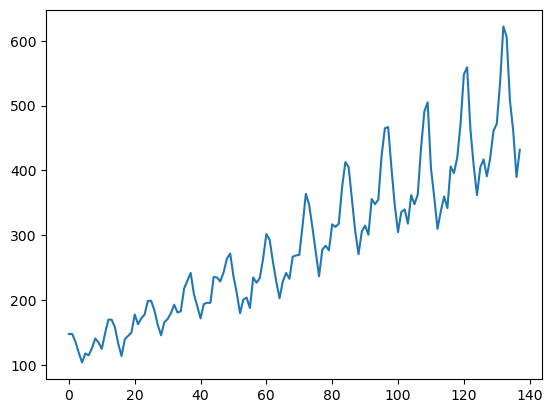

In [ ]:
from matplotlib import pyplot as plt
plt.plot(data[:,-1],label = 'real data')

In [ ]:
# fit an xgboost model and make a one step prediction
def xgboost_forecast(train, testX):
     # transform list into array
     train = asarray(train)
     # split into input and output columns
     trainX, trainy = train[:, :-1], train[:, -1]
     # fit model
     model = XGBRegressor( n_estimators=1000)
     model.fit(trainX, trainy)
     # make a one-step prediction
     yhat = model.predict(asarray([testX]))
     return yhat[0]

In [ ]:
# Roll-forward validation for univariate data
def Roll_forward_validation(data, n_test):
     predictions = list()
     # split dataset
     train, test = train_test_split(data, n_test)
     # seed history with training dataset
     history = [x for x in train]
     # step over each time-step in the test set
     for i in range(len(test)):
     # split test row into input and output columns
         testX, testy = test[i, :-1], test[i, -1]
         # fit model on history and make a prediction
         yhat = xgboost_forecast(history, testX)
         # store forecast in list of predictions
         predictions.append(yhat)
         # add actual observation to history for the next loop
         history.append(test[i])
     # summarize progress
     print("expected=",testy)
     print("predicted=",yhat)
     # estimate prediction error
     MSE = np.square(np.subtract(test[:, -1], predictions)).mean() 
     RMSE = math.sqrt(MSE)
     return RMSE, test[:, -1], predictions
# ********************************************************************

expected= 432.0
predicted= 387.76913
RMSE: 60.06504166950031


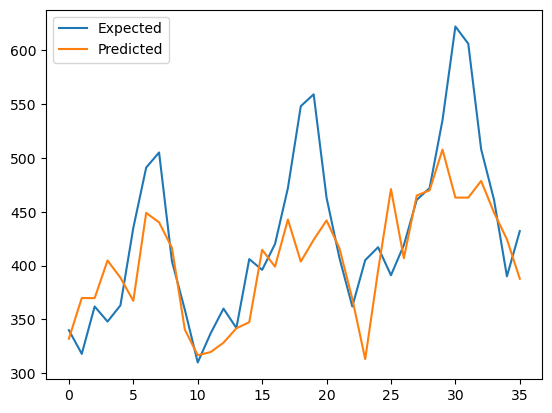

In [ ]:
import math
import numpy as np
# evaluation
RMSE, y, yhat = Roll_forward_validation(data, 36)
print('RMSE:', RMSE)
# plot expected vs preducted
pyplot.plot(y, label='Expected')
pyplot.plot(yhat, label='Predicted')
pyplot.legend()
pyplot.show()

Fixed Partitioning

expected= 432.0
predicted= 331.97528
rmse 93.5342168727216


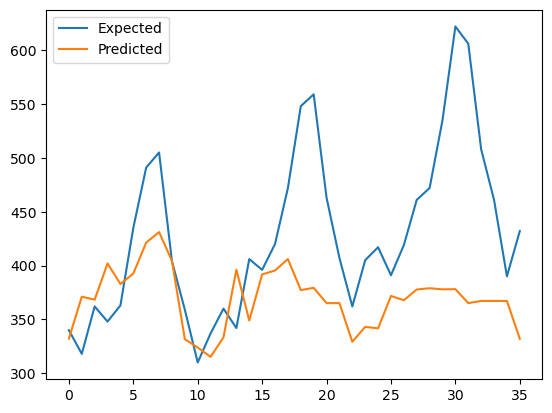

In [ ]:
# Fixed Partitioning
series = read_csv('airline-passengers.csv', header=0, index_col=0)
values = series.values
data= pd.DataFrame(values, columns = ['values'])
data['lag6'] = data['values'].shift(6)
data['lag5'] = data['values'].shift(5)
data['lag4'] = data['values'].shift(4)
data['lag3'] = data['values'].shift(3)
data['lag2'] = data['values'].shift(2)
data['lag1'] =data['values'].shift(1)
data['y'] = data['values']
data=data.drop(['values'], axis=1)
data.dropna(inplace=True)
data =data.to_numpy()
#***********************************************8
predictions = list()
train, test = train_test_split(data,36)
for i in range(len(test)):
    # split test row into input and output columns
     testX, testy = test[i, :-1], test[i, -1]
     # fit model on history and make a prediction
     yhat = xgboost_forecast(train, testX)
     # store forecast in list of predictions
     predictions.append(yhat)
print("expected=",testy)
print("predicted=",yhat)
# estimate prediction error
MSE = np.square(np.subtract(test[:, -1], predictions)).mean() 
RMSE = math.sqrt(MSE)
rmse, y, yhat = RMSE, test[:, -1], predictions
print("rmse",rmse)
pyplot.plot(y, label='Expected')
pyplot.plot(yhat, label='Predicted')
pyplot.legend()
pyplot.show()

#Cross forward validation

In [ ]:
# finalize model and make a prediction for monthly births with xgboost
from numpy import asarray
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from xgboost import XGBRegressor
 
#  transform a time series dataset into a supervised learning dataset
series = read_csv('airline-passengers.csv', header=0, index_col=0)
values = series.values
data= pd.DataFrame(values, columns = ['values'])
data['lag6'] = data['values'].shift(6)
data['lag5'] = data['values'].shift(5)
data['lag4'] = data['values'].shift(4)
data['lag3'] = data['values'].shift(3)
data['lag2'] = data['values'].shift(2)
data['lag1'] =data['values'].shift(1)
data['value'] = data['values']
data=data.drop(['values'], axis=1)
data.dropna(inplace=True)
#transform the time series data into supervised learning
train =data.to_numpy()
# split into input and output columns
trainX, trainy = train[:, :-1], train[:, -1]
# fit model
model = XGBRegressor()
model.fit(trainX, trainy)
# construct an input for a new preduction
row = values[-6:].flatten()
# make a one-step prediction
yhat = model.predict(asarray([row]))
print("Input",row)
print("Predicted:",yhat[0])

Input [622 606 508 461 390 432]
Predicted: 428.1761


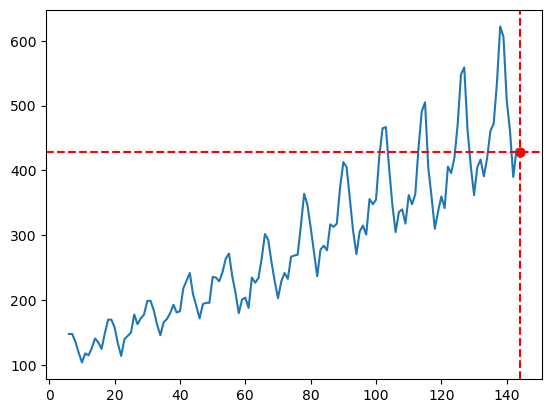

In [ ]:
plt.plot(data.index,data["value"],label = 'real data')
plt.scatter(138+data.index[0],yhat[0], color= 'red', s=[40], label= 'Forecasted t+1 value')
plt.axhline(y=yhat[0], color='r', linestyle='--')
plt.axvline(x=138+data.index[0], color='r', linestyle='--')

In [ ]:
#pros
#XGBOOST Algorithm and all the other supervisd machine learning ..
#are very significant in time series problems as it is very Fast training time that it handle complex relationships
#without decompose it to its component for tge data of each user (fit for all users :only insert the data for each user to the same model)
#It also provide information about the importance of each feature in predicting the target variable,...
#which can be useful in time series analysis for feature selection and understanding relationships between the features and the target variable.

In [ ]:
#pros
#XGBOOST Algorithm and all the other supervisd machine learning ..
#are very significant in time series problems as it is very Fast training time that it handle complex relationships
#without decompose it to its component for tge data of each user (fit for all users :only insert the data for each user to the same model)
#It also provide information about the importance of each feature in predicting the target variable,...
#which can be useful in time series analysis for feature selection and understanding relationships between the features and the target variable.

In [ ]:
#facebookprophet

In [ ]:
# Python
!pip install prophet
import pandas as pd
from prophet import Prophet

In [ ]:
df = pd.read_csv('airline-passengers.csv')
df.head()

,Month,Passengers
0,1949-01,112
1,1949-02,118
2,1949-03,132
3,1949-04,129
4,1949-05,121


In [ ]:
df["Month"]= pd.to_datetime(df["Month"], format="%Y-%m")

In [ ]:
#Facebook propphet expect two columns with names[ds:date ,y:values]
df.rename(columns = {'Month':'ds', 'Passengers':'y'}, inplace = True)
df

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121
...,...,...
139,1960-08-01,606
140,1960-09-01,508
141,1960-10-01,461
142,1960-11-01,390


<AxesSubplot:xlabel='ds'>

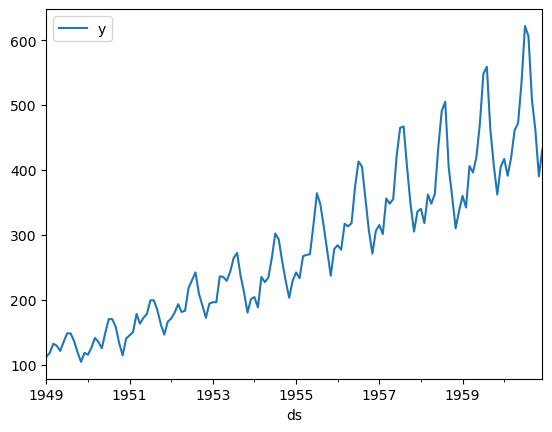

In [ ]:
data=df
data= data.set_index("ds")
data.plot()

In [ ]:
m = Prophet(seasonality_mode='multiplicative')
m.fit(df)
#Prophet allow to change the mode of seasonality as an input to perform better.
#by default prophet fit weekly and yearly seasonalities.

# *****************************************************
#   <<Facebook prophet algorithm handle multiple seasonality.....>>
#   <<By adding the additional seasonalities as extra Fourier terms in the model>>

# *****************************************************
#   <<Facebook prophet algorithm also detect time series data with not constant trend pattern....>>
#   <<Prophet will automatically detect these changepoints and will allow the trend to adapt appropriately>>

# *********************************************************
#     The model is an additive regression model, which means that:
#     it assumes the trend, seasonality, and holiday effects all contribute additively to the overall signal.

00:13:18 - cmdstanpy - INFO - Chain [1] start processing
00:13:18 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
future = m.make_future_dataframe(periods=365)
# {m.make_future_dataframe(periods=365)} will make the date dataframe of the future which model will predict for them
future.tail()

,ds
504,1961-11-27
505,1961-11-28
506,1961-11-29
507,1961-11-30
508,1961-12-01


In [ ]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
#<<yhat_lower,yhat_upper>> express Uncertainty

,ds,yhat,yhat_lower,yhat_upper
0,1949-01-01,103.984056,90.843611,118.052189
1,1949-02-01,100.466875,87.615069,113.378887
2,1949-03-01,114.967232,101.453871,128.034299
3,1949-04-01,116.516825,103.050600,129.645999
4,1949-05-01,119.409651,106.572752,132.318320
...,...,...,...,...
504,1961-11-27,478.771834,465.140659,491.971538
505,1961-11-28,477.047415,463.793718,490.342541
506,1961-11-29,475.626800,463.707298,488.443211
507,1961-11-30,474.558010,462.288051,487.435553


In [ ]:
#Prophet automatic detects changepoints<<change in the rate >> ......
#by first specifying a large number of  changepoints at which the rate  probably change.
#but will use as few of them as possiblet<automatically optimization> to prevent the overfitting on the history data.
# ***************************************************

#If the trend changes are being overfit (too much flexibility) or underfit, you can adjust the priority using the input argument <<changepoint_prior_scale>>.
#changepoint_prior_scale like regularization(L1,L2 norm)

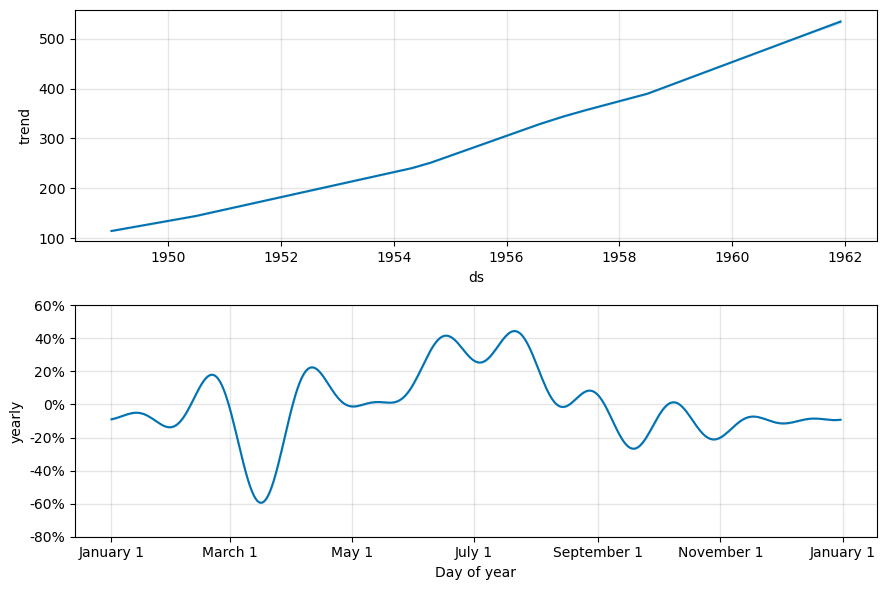

In [ ]:
fig2 = m.plot_components(forecast)

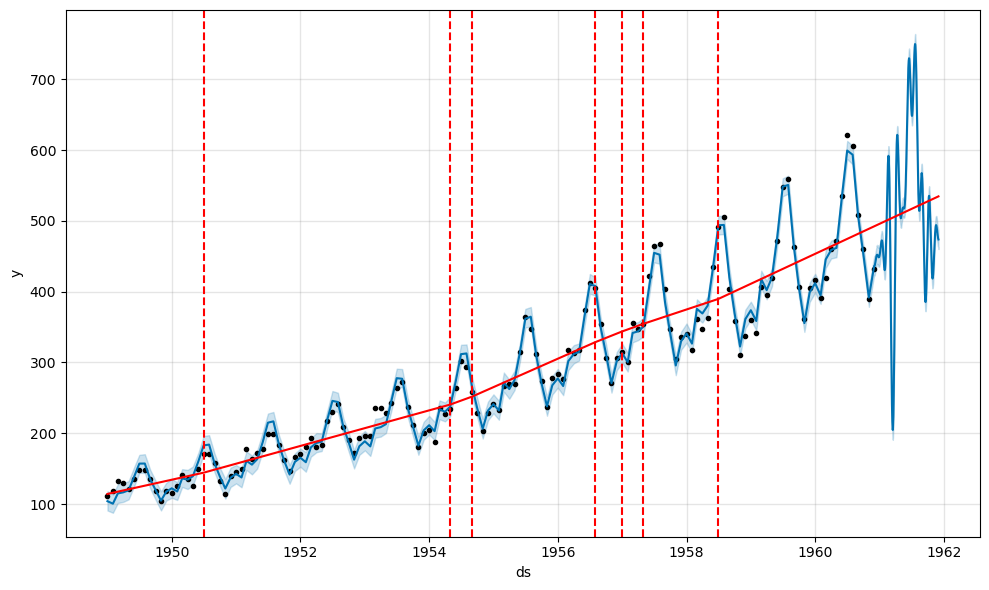

In [ ]:
#Automatic changepoint detection in Prophet
from prophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In [ ]:
#Instead of using automatic changepoint detection .....
#you can manually specify the locations of potential changepoints with the changepoints argument. 
#***********************************************************************************************

#Also you can enter customizable parameters, such as trend, seasonality, and holidays.
#Prophet use this information as an input features in the dataframe

In [ ]:
#Make matric datframe which containactual and prediction values to evaluate the forcasting.
metric_df = forecast.set_index('ds')[['yhat']].join(df.set_index('ds').y).reset_index()
metric_df.dropna(inplace=True)
metric_df.tail()

,ds,yhat,y
139,1960-08-01,593.618536,606.0
140,1960-09-01,507.044302,508.0
141,1960-10-01,452.554715,461.0
142,1960-11-01,391.794943,390.0
143,1960-12-01,436.230373,432.0


In [ ]:
import math
import numpy as np

In [ ]:
def rmse(observations, estimates):
    
    RMSE = np.square(np.subtract(observations, estimates)).mean()
    
    return RMSE

In [ ]:
rmse(metric_df.y, metric_df.yhat)

104.22595982848917

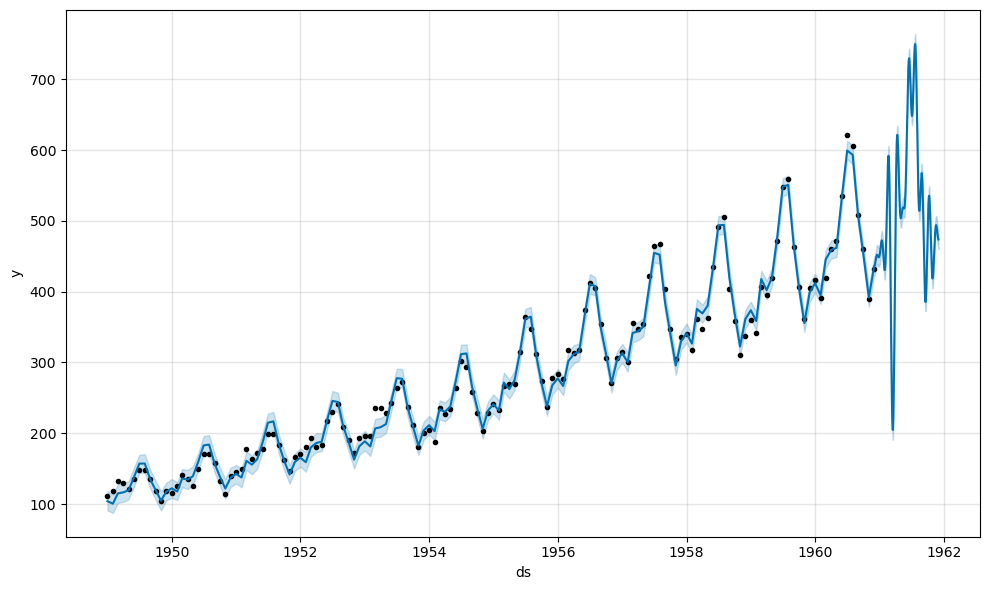

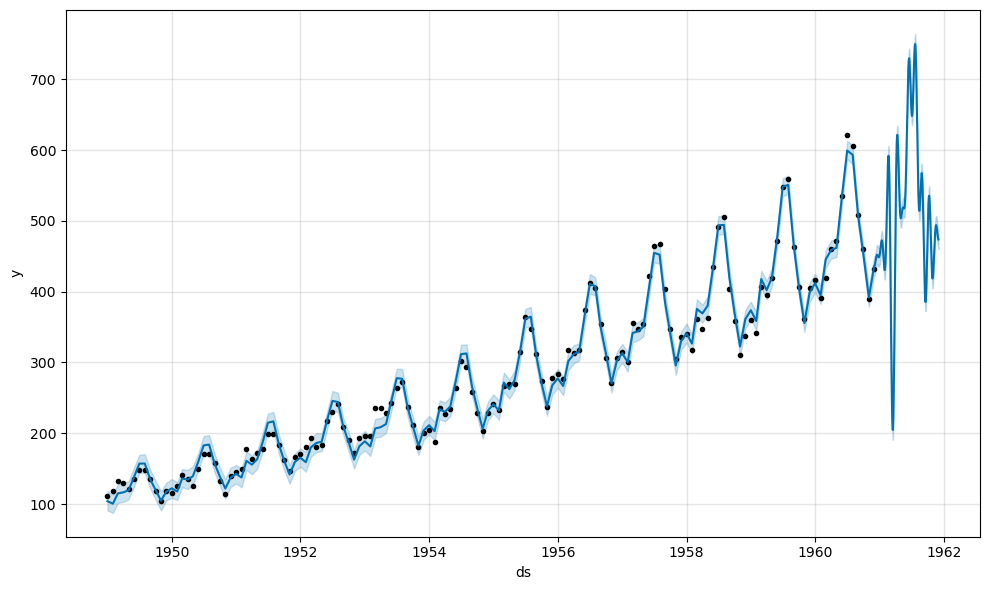

In [ ]:
m.plot(forecast)

In [ ]:
from prophet.diagnostics import cross_validation
#initial '730 days'means the train data is the first two years then make cutoff{break point} 
#then test data is the next year{ horizon = '365 days'}
#period='180 days'means after make the first cross validation ,cutoff point will shift{period='180 days'}
#from the begining data to cutoff point is train data
#the next{horizon = '365 days'}from cutoff point is test data
df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')
df_cv.head()

  0%|          | 0/19 [00:00<?, ?it/s]

00:15:34 - cmdstanpy - INFO - Chain [1] start processing
00:15:57 - cmdstanpy - INFO - Chain [1] done processing
00:15:58 - cmdstanpy - INFO - Chain [1] start processing
00:15:58 - cmdstanpy - INFO - Chain [1] done processing
00:15:58 - cmdstanpy - INFO - Chain [1] start processing
00:15:59 - cmdstanpy - INFO - Chain [1] done processing
00:15:59 - cmdstanpy - INFO - Chain [1] start processing
00:16:00 - cmdstanpy - INFO - Chain [1] done processing
00:16:00 - cmdstanpy - INFO - Chain [1] start processing
00:16:00 - cmdstanpy - INFO - Chain [1] done processing
00:16:01 - cmdstanpy - INFO - Chain [1] start processing
00:16:01 - cmdstanpy - INFO - Chain [1] done processing
00:16:01 - cmdstanpy - INFO - Chain [1] start processing
00:16:02 - cmdstanpy - INFO - Chain [1] done processing
00:16:02 - cmdstanpy - INFO - Chain [1] start processing
00:16:03 - cmdstanpy - INFO - Chain [1] done processing
00:16:03 - cmdstanpy - INFO - Chain [1] start processing
00:16:04 - cmdstanpy - INFO - Chain [1]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1951-02-01,160.270501,159.958164,160.594464,150,1951-01-18
1,1951-03-01,174.904285,173.844069,176.039867,178,1951-01-18
2,1951-04-01,159.530567,157.757961,161.498430,163,1951-01-18
3,1951-05-01,142.080080,139.597575,144.710864,172,1951-01-18
4,1951-06-01,180.251440,175.818695,184.907570,178,1951-01-18


In [ ]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,40 days,322.148757,17.948503,14.420280,0.050404,0.039238,0.049964,0.272727
1,42 days,251.039774,15.844235,12.413940,0.044408,0.032598,0.043650,0.318182
2,46 days,234.546512,15.314911,12.501916,0.047345,0.034445,0.046226,0.272727
3,47 days,242.280378,15.565358,12.789714,0.045849,0.034445,0.044861,0.272727
4,48 days,240.301171,15.501651,12.701324,0.045831,0.035243,0.044852,0.272727


In [ ]:
#after cross_validation :performance_metrics takes points from each cross validation with different farness from break point..
#and evaluate"the prediction and real value"
#so performance_metrics evaluate"long-term and short-term forecasting"

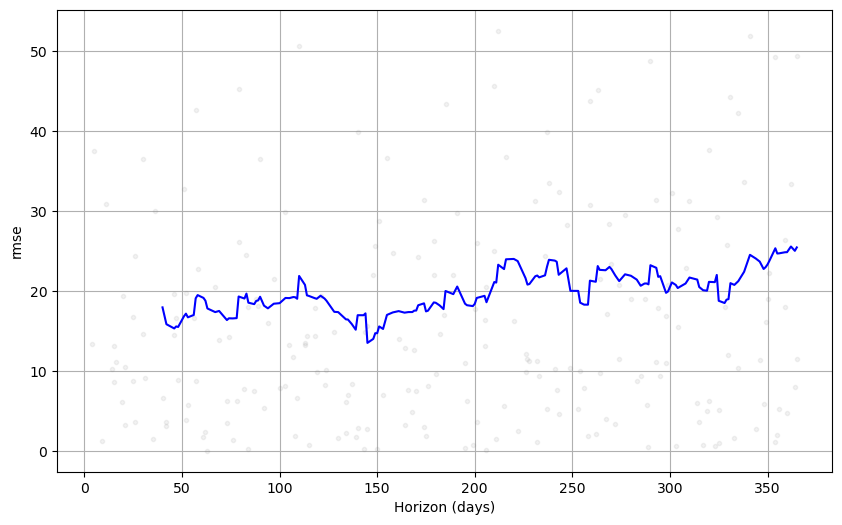

In [ ]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [ ]:
#Fixed Partitioning

In [ ]:
# if we applied cross validation wit initial 8 years then horizon period will be the last 3 years ..
# that make fixed partitioning

In [ ]:
df_fp = cross_validation(m, initial='2920 days', period='180 days', horizon = '1095 days')
df_fp.head()

  0%|          | 0/2 [00:00<?, ?it/s]

00:17:00 - cmdstanpy - INFO - Chain [1] start processing
00:17:00 - cmdstanpy - INFO - Chain [1] done processing
00:17:01 - cmdstanpy - INFO - Chain [1] start processing
00:17:01 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,1957-07-01,453.823388,444.939911,463.341957,465,1957-06-05
1,1957-08-01,450.397945,441.391553,459.658881,467,1957-06-05
2,1957-09-01,397.747055,388.981710,406.531271,404,1957-06-05
3,1957-10-01,348.898690,340.003105,358.200252,347,1957-06-05
4,1957-11-01,306.802435,297.492699,315.134795,305,1957-06-05


In [ ]:
df1_p = performance_metrics(df_fp)
df1_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,118 days,562.879088,23.725073,19.043643,0.052216,0.035550,0.050367,0.285714
1,120 days,911.731251,30.194888,24.684756,0.069580,0.056884,0.066279,0.285714
2,149 days,858.758039,29.304574,22.179295,0.062298,0.035550,0.059219,0.428571
3,150 days,1046.081974,32.343191,25.498410,0.072897,0.103039,0.068910,0.428571
4,179 days,915.336193,30.254524,22.615527,0.063528,0.037459,0.060164,0.428571


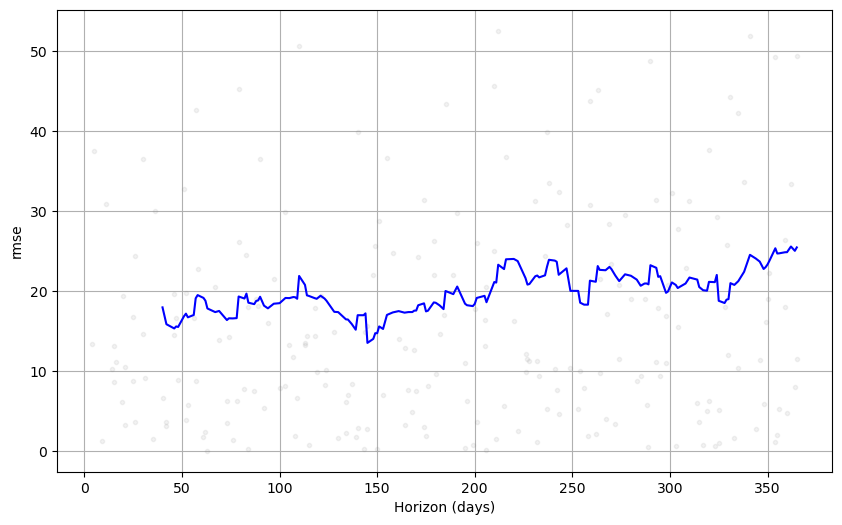

In [ ]:
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [ ]:
#pros

#1. handle missing data and outliers #2. flexibility to enter customizable parameters, such as trend, seasonality, and holidays. #3. it provides uncertainty intervals for the forecasts #4. handle complex time series data by using additive models together #5. The best way to handle outliers is to remove them - #6. Prophet has no problem with missing data. If you set their values to NA in the history... but leave the dates in future, then Prophet will give you a prediction for their values #7. friendly interface: Prophet is designed to be user-friendly and requires minimal technical knowledge

#cons

#1. Not suitable for long-term forecasting. #2. High computational requirements: Prophet can be computationally expensive, particularly when working with large datasets or complex models. #3. Limited to univariate time series data #4. {fit per user}